# CNN-RNN Model Training, Dependent Labels
## Author: Ian Scarff (iie728)

In [1]:
import pandas as pd
import numpy as np
import json
import os
import imageio
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MultiLabelBinarizer
import time
import datetime

import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torchvision
import torch.nn.functional as F
from torchvision import transforms
from torchvision import models
from torch.utils.data import DataLoader, SubsetRandomSampler
from sklearn.model_selection import KFold
import skimage

from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

import warnings
warnings.filterwarnings('ignore')

## Setup

In [2]:
classes = ['Smears', 'Loaded Language', 'Name calling/Labeling', 'Glittering generalities (Virtue)',
               'Appeal to (Strong) Emotions', 'Appeal to fear/prejudice', 'Transfer', 'Doubt',
               'Exaggeration/Minimisation', 'Whataboutism', 'Slogans', 'Flag-waving',
               "Misrepresentation of Someone's Position (Straw Man)", 'Causal Oversimplification',
               'Thought-terminating cliché', 'Black-and-white Fallacy/Dictatorship', 'Appeal to authority',
               'Reductio ad hitlerum', 'Repetition', 'Obfuscation, Intentional vagueness, Confusion',
               'Presenting Irrelevant Data (Red Herring)', 'Bandwagon']

### Create Class Binarizer
one_hot = MultiLabelBinarizer()
one_hot.fit([classes])

MultiLabelBinarizer()

In [3]:
from CustomLoader import ImageLoader

In [4]:
training_data = ImageLoader(json_file = 'training_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

testing_data = ImageLoader(json_file = 'testing_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

In [5]:
train_loader = DataLoader(dataset = training_data, batch_size = 25, shuffle = True)
test_loader = DataLoader(dataset = testing_data, batch_size = 25, shuffle = True)

# 
# 
# 

## Define CNN-RNN Architectures (Set Hidden Size)

### ResNet18-LSTM

In [6]:
### Define Class
class ResNet18_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet18_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet18 = models.resnet18(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet18.fc.in_features
        
        ### Freeze Parameters
        for param in resnet18.parameters():
            param.requires_grad = False
            
        ### CNN Encoder, remove prediction layer
        self.cnn = nn.Sequential(*list(resnet18.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet50-LSTM

In [7]:
### Define Class
class ResNet50_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet50_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet50 = models.resnet50(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet50.fc.in_features
        
        for param in resnet50.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet50.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)    
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet101-LSTM

In [8]:
### Define Class
class ResNet101_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet101_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet101 = models.resnet101(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet101.fc.in_features
        
        for param in resnet101.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet101.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet121-LSTM

In [9]:
### Define Class
class DenseNet121_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet121_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet121 = models.densenet121(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 50176 # densenet121.classifier.in_features
        
        for param in densenet121.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet121.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
#         self.cnn_output_size = image_emb.shape[0]
        
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)

        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet169-LSTM

In [10]:
### Define Class
class DenseNet169_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet169_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet169 = models.densenet169(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 81536 # densenet169.classifier.in_features
        
        for param in densenet169.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet169.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
           
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet201-LSTM

In [11]:
### Define Class
class DenseNet201_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet201_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
               
        
        ### Import DenseNet101
        densenet201 = models.densenet201(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 94080 #densenet201.classifier.in_features
        
        
        for param in densenet201.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet201.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        
        image_emb = torch.flatten(image_emb, 1)
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG11_BN-LSTM

In [12]:
### Define Class
class VGG11_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG11_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg11bn = models.vgg11_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg11bn.classifier[6].in_features
        
       
        for param in vgg11bn.parameters():
            param.requires_grad = False

        
        vgg11bn.classifier = nn.Sequential(*list(vgg11bn.classifier.children())[:-1])
        
            
        ### CNN Encoder
        self.cnn = vgg11bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG16_BN-LSTM

In [13]:
### Define Class
class VGG16_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG16_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg16bn = models.vgg16_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg16bn.classifier[6].in_features
        
        for param in vgg16bn.parameters():
            param.requires_grad = False

        
        vgg16bn.classifier = nn.Sequential(*list(vgg16bn.classifier.children())[:-1])

            
        ### CNN Encoder
        self.cnn = vgg16bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG19_BN-LSTM

In [14]:
### Define Class
class VGG19_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG19_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg19bn = models.vgg19_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg19bn.classifier[6].in_features
        
        for param in vgg19bn.parameters():
            param.requires_grad = False

        
        vgg19bn.classifier = nn.Sequential(*list(vgg19bn.classifier.children())[:-1])
            
        ### CNN Encoder
        self.cnn = vgg19bn
        
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

# 
# 
# 

## Define Training Methodology

In [15]:
def get_lr(optim):
    for param_group in optim.param_groups:
        return param_group['lr']

In [16]:
### This function is used to train a cnn model
def Kfold_train_CNN_RNN(model = None, training_data = None, learning_rate = None, k_folds = None, n_epochs = None, model_name = None):
    
    ### Check that all entries are valid
    if ((model == None) or (training_data == None) or (model_name == None) or 
        (learning_rate == None) or (k_folds == None) or (n_epochs == None)):
        print ('Enter all info.')
        
        
        
    ### Run K-Fold CV
    else:
        
        device = 'cpu'

        ### Set Loss Function and Optimizer
        criterion = nn.BCELoss()
        
        
        #### Define the K-fold Cross Validator
        kfold = KFold(n_splits=k_folds, shuffle=True)
        
        
        
        ### Create values to hold the best model metrics across folds
        val_f1_mic_max = 0 ### This determines best model
        
        best_train_loss = 0
        best_train_acc = 0
        best_train_f1_mic = 0
        best_train_f1_mac = 0
        best_train_prec_mic = 0
        best_train_prec_mac = 0
        best_train_rec_mic = 0
        best_train_rec_mac = 0

        best_val_acc = 0
        best_val_loss = 0
#         best_val_f1_mic = 0
        best_val_f1_mac = 0
        best_val_prec_mic = 0
        best_val_prec_mac = 0
        best_val_rec_mic = 0
        best_val_rec_mac = 0
        
        best_fold = 0
        best_epoch = 0
        

        
        ### Start print

        start = time.time()
        
        ### K-fold Cross Validation model evaluation
        for fold, (train_ids, val_ids) in enumerate(kfold.split(training_data)):
            
            print('-------------------------------------------')
            print('FOLD {}'.format(fold + 1))
            print('-------------------------------------------')
            
            ### Sample elements randomly from a given list of ids, no replacement
            train_subsampler = SubsetRandomSampler(train_ids)
            val_subsampler = SubsetRandomSampler(val_ids)
            
            ### Define data loaders for training and validation in current fold
            train_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = train_subsampler)
            val_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = val_subsampler)
            
            ### Initialize network
            network = model
            if torch.cuda.is_available():
                network.cuda()
                network = nn.DataParallel(network, list(range(2)))
                device = 'cuda'
            
            ### Initialize optimizer
            optimizer = optim.Adam(network.parameters(), lr=learning_rate)
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.1, patience = 5)
            
            
            ### Create lists of values at the end of each epoch for each fold
            train_loss = []
            train_acc = []
            train_f1_mic = []
            train_f1_mac = []
            train_prec_mic = []
            train_prec_mac = []
            train_rec_mic = []
            train_rec_mac = []
            
            val_loss = []
            val_acc = []
            val_f1_mic = []
            val_f1_mac = []
            val_prec_mic = []
            val_prec_mac = []
            val_rec_mic = []
            val_rec_mac = []
            
            
            ### Train network
            for epoch in range(n_epochs):
                
                ### Hold training predictions and targets
                train_output = np.empty((0,22), int)
                train_all_targets = np.empty((0,22), int)
                
                val_output = np.empty((0,22), int)
                val_all_targets = np.empty((0,22), int)
                
                
                ### Train ###
                network.train()
                
                train_running_loss = 0.0
                
                batch_number = 0
                for i, data in enumerate(train_loader):
                    
                    images, targets = data[0].to(device), data[1].float().to(device)
                    optimizer.zero_grad()
                    
                    output = network(images)
                    
                    loss = criterion(output, targets) 
                    train_running_loss += loss.item()
                                        
                    ### Append output
                    train_output = np.vstack((train_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    train_all_targets = np.vstack((train_all_targets, targets.cpu().numpy().astype('int')))

                    loss.backward()
                    optimizer.step()
                                        
                    
                ### Calculate metrics and append
                train_loss.append(train_running_loss/len(train_loader.dataset))
                train_acc.append(accuracy_score(train_all_targets, train_output))
                train_f1_mic.append(f1_score(train_all_targets, train_output, average = 'micro'))
                train_f1_mac.append(f1_score(train_all_targets, train_output, average = 'macro'))
                train_prec_mic.append(precision_score(train_all_targets, train_output, average = 'micro'))
                train_prec_mac.append(precision_score(train_all_targets, train_output, average = 'macro'))
                train_rec_mic.append(recall_score(train_all_targets, train_output, average = 'micro'))
                train_rec_mac.append(recall_score(train_all_targets, train_output, average = 'macro'))
                
                
                ### Validate###
                network.eval()
                val_running_loss = 0.0

                                
                for i, data in enumerate(val_loader):
                    images, targets = data[0].to(device), data[1].float().to(device)
                    output = network(images)
                    loss = criterion(output, targets)
                    val_running_loss += loss.item()
                    
                    ### Append output
                    val_output = np.vstack((val_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    val_all_targets = np.vstack((val_all_targets, targets.cpu().numpy().astype('int')))

                
                ### Calculate metrics and append
                val_loss.append(val_running_loss/len(val_loader.dataset))
                val_acc.append(accuracy_score(val_all_targets, val_output))
                val_f1_mic.append(f1_score(val_all_targets, val_output, average = 'micro'))
                val_f1_mac.append(f1_score(val_all_targets, val_output, average = 'macro'))
                val_prec_mic.append(precision_score(val_all_targets, val_output, average = 'micro'))
                val_prec_mac.append(precision_score(val_all_targets, val_output, average = 'macro'))
                val_rec_mic.append(recall_score(val_all_targets, val_output, average = 'micro'))
                val_rec_mac.append(recall_score(val_all_targets, val_output, average = 'macro'))
                
                
                ### Save model with the lowest validation loss
                if val_f1_mic[epoch] > val_f1_mic_max:
                    print('Validation F1 Micro Score Increased ({:.6f} --> {:.6f}).  Saving model ...\n'.format(
                    val_f1_mic_max,
                    val_f1_mic[epoch]))
                    torch.save(network.state_dict(), 'BestCnnRnnModels/' + model_name +'.pt')
                    val_f1_mic_max = val_f1_mic[epoch]
                    
                    ### Set current best metrics
                    best_train_loss = train_loss[epoch]
                    best_train_acc = train_acc[epoch]
                    best_train_f1_mic = train_f1_mic[epoch]
                    best_train_f1_mac = train_f1_mac[epoch]
                    best_train_prec_mic = train_prec_mic[epoch]
                    best_train_prec_mac = train_prec_mac[epoch]
                    best_train_rec_mic = train_rec_mic[epoch]
                    best_train_rec_mac = train_rec_mac[epoch]

                    best_val_acc = val_acc[epoch]
                    best_val_loss = val_loss[epoch]
#                     best_val_f1_mic = val_f1_mic[epoch]
                    best_val_f1_mac = val_f1_mac[epoch]
                    best_val_prec_mic = val_prec_mic[epoch]
                    best_val_prec_mac = val_prec_mac[epoch]
                    best_val_rec_mic = val_rec_mic[epoch]
                    best_val_rec_mac = val_rec_mac[epoch]

                    best_fold = fold + 1
                    best_epoch = epoch + 1
                    
                    
                    
                ### Display summary for epoch
                print('Epoch {} \tLearning Rate: {} \tTime (min): {}'.format(epoch+1, get_lr(optimizer), round((time.time()-start)/60, 2)))
                print('Train Loss: {} \tValidation Loss: {}'. format(round(train_loss[epoch], 4),
                                                                     round(val_loss[epoch], 4)))
                print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(train_acc[epoch], 4),
                                                                            round(val_acc[epoch], 4)))
                print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(train_f1_mic[epoch], 4),
                                                                            round(val_f1_mic[epoch], 4)))
                print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(train_f1_mac[epoch], 4),
                                                                            round(val_f1_mac[epoch], 4)))
                print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(train_prec_mic[epoch], 4),
                                                                                          round(val_prec_mic[epoch], 4)))
                print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(train_prec_mac[epoch], 4),
                                                                                          round(val_prec_mac[epoch], 4)))
                print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(train_rec_mic[epoch], 4),
                                                                                    round(val_rec_mic[epoch], 4)))
                print('Train Recall Marco: {} \tValidation Recall Macro: {}\n'.format(round(train_rec_mac[epoch], 4),
                                                                                    round(val_rec_mac[epoch], 4)))
                
                
                ### Update learning rate if needed
                scheduler.step(val_loss[epoch])
                
                
                
            ### Display summary graph of fold
            fig, (ax1, ax3) = plt.subplots(1,2, figsize = (20,6))
            ax1.set_xlabel('Epoch')
            ax1.set_ylabel('Loss')
            ln1 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), train_loss, label = 'Train Loss')
            ln2 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), val_loss, label = 'Val Loss')
            
            ax2 = ax1.twinx()
            ax2.set_ylabel('Accuracy')
            ln3 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), train_acc, marker = 'o', label = 'Train Acc')
            ln4 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), val_acc, marker = 'o', label = 'Val Acc')
            
            lns1 = ln1 + ln2 + ln3 + ln4
            labs1 = [l.get_label() for l in lns1]
            
            ax3.set_xlabel('Epoch')
            ax3.set_ylabel('Score')
            ln5 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mic, marker = 'v', label = 'Train F1 Micro')
            ln6 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mic, marker = 'v', label = 'Val F1 Micro')
            ln7 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mac, marker = '^', label = 'Train F1 Macro')
            ln8 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mac, marker = '^', label = 'Val F1 Micro')
            ln9 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mic, marker = 'd', label = 'Train Prec. Micro')
            ln10 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mic, marker = 'd', label = 'Val Prec. Micro')
            ln11 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mac, marker = 'X', label = 'Train Prec. Macro')
            ln12 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mac, marker = 'X', label = 'Val Prec. Macro')
            ln13 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mic, marker = 'P', label = 'Train Rec. Micro')
            ln14 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mic, marker = 'P', label = 'Val Rec. Micro')
            ln15 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mac, marker = 's', label = 'Train Rec. Macro')
            ln16 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mac, marker = 's', label = 'Val Rec. Macro')
            
            lns2 = ln5 + ln6 + ln7 + ln8 +  ln9 + ln10 + ln11 + ln12 + ln13 + ln14 + ln15 + ln16
            labs2 = [l.get_label() for l in lns2]
            
            
            ax1.legend(lns1, labs1, loc = 'upper left', bbox_to_anchor = (1.1,1))
            ax3.legend(lns2, labs2, loc = 'upper left', bbox_to_anchor = (1.05,1))
            fig.tight_layout()
            
            plt.show()
            
            fig.savefig('CNN_RNN_500_1_50_TrainingSummary/' + model_name + '_FOLD' + str(fold+1) + '.png')
        
        
        
        ### Display metrics of the best model
                
        print('------------------------------------------------------------')
        print('------------------------------------------------------------')
        
        print('\nMetrics of Best Model:')
        print('Fold: {} \tEpoch: {}'.format(best_fold, best_epoch))
        print('Train Loss: {} \tValidation Loss: {}'. format(round(best_train_loss, 4),
                                                             round(best_val_loss, 4)))
        print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(best_train_acc, 4),
                                                                    round(best_val_acc, 4)))
        print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(best_train_f1_mic, 4),
                                                                    round(val_f1_mic_max, 4)))
        print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(best_train_f1_mac, 4),
                                                                    round(best_val_f1_mac, 4)))
        print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(best_train_prec_mic, 4),
                                                                                  round(best_val_prec_mic, 4)))
        print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(best_train_prec_mac, 4),
                                                                                  round(best_val_prec_mac, 4)))
        print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(best_train_rec_mic, 4),
                                                                            round(best_val_rec_mic, 4)))
        print('Train Recall Marco: {} \tValidation Recall Macro: {}'.format(round(best_train_rec_mac, 4),
                                                                            round(best_val_rec_mac, 4)))
        
        
        ### Return best metrics
        return [best_fold, best_epoch, best_train_loss, best_train_acc, best_train_f1_mic, best_train_f1_mac, best_train_prec_mic, best_train_prec_mac, best_train_rec_mic, best_train_rec_mac,
                best_val_loss, best_val_acc, val_f1_mic_max, best_val_f1_mac, best_val_prec_mic, best_val_prec_mac, best_val_rec_mic, best_val_rec_mac]
  

# 
# 

## Initialize Models: Hidden Size = 500, Number of Layers = 1, Dropout = 50%

In [17]:
resnet18LSTM_500_1_50 = ResNet18_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
resnet50LSTM_500_1_50 = ResNet50_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
resnet101LSTM_500_1_50 = ResNet101_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)

densenet121LSTM_500_1_50 = DenseNet121_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
densenet169LSTM_500_1_50 = DenseNet169_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
densenet201LSTM_500_1_50 = DenseNet201_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)

vgg11bnLSTM_500_1_50 = VGG11_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
vgg16bnLSTM_500_1_50 = VGG16_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
vgg19bnLSTM_500_1_50 = VGG19_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)

## Train Models

In [18]:
START = time.time()

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0168 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0526 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0423 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1111 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1118 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0344 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0352 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.3
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

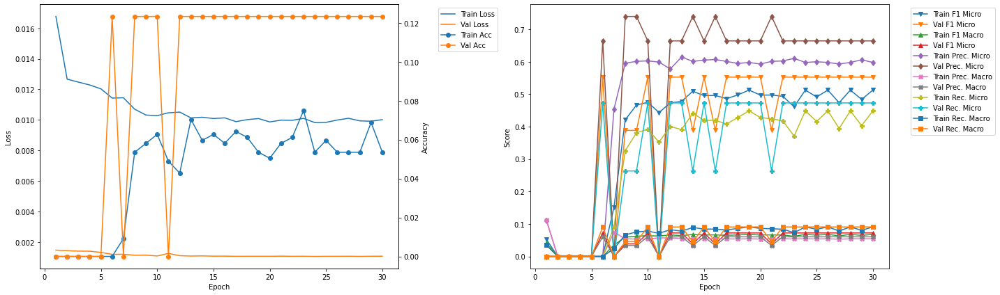

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 3.92
Train Loss: 0.0121 	Validation Loss: 0.0014
Train Accuracy: 0.0321 	Validation Accuracy: 0.0
Train F1 Mirco: 0.3051 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0572 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5595 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0691 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.2097 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0504 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.05
Train Loss: 0.012 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.363
Train F1 Marco: 0.0004 	Validation F1 Macro: 0.0365
Train Precision Mirco: 0.5 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0227 	Validation Precision Macro: 0.0305
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.

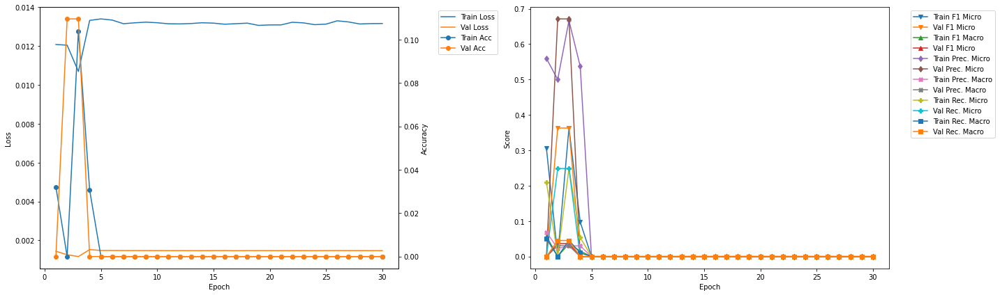

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 7.65
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 7.78
Train Loss: 0.0131 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

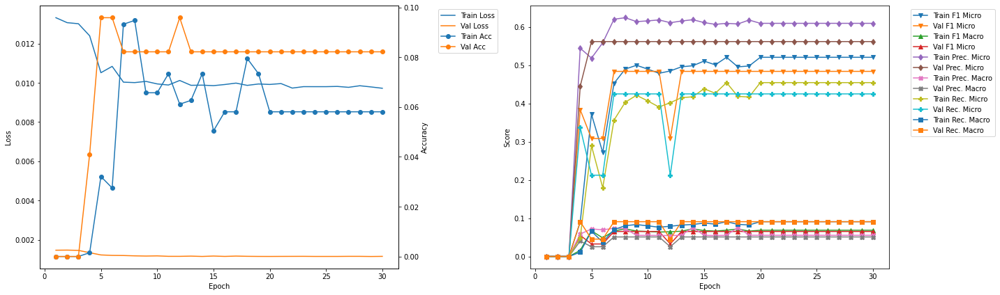

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.39
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4697 	Validation F1 Micro: 0.3469
Train F1 Marco: 0.0628 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.6069 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0539 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.3831 	Validation Recall Micro: 0.2374
Train Recall Marco: 0.0756 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.51
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4712 	Validation F1 Micro: 0.5291
Train F1 Marco: 0.0629 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.5993 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0533 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.3882

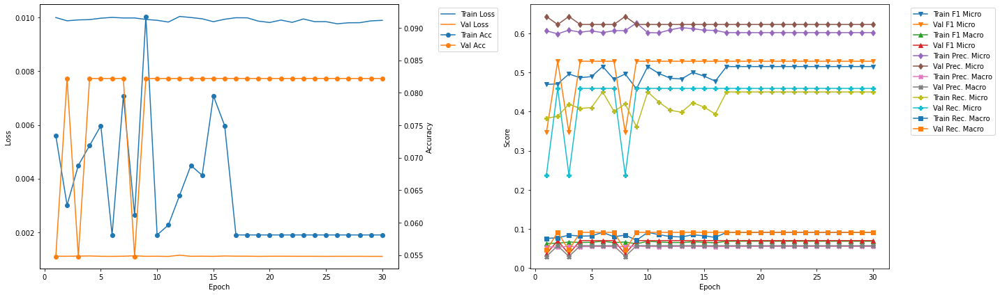

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 15.12
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4794 	Validation F1 Micro: 0.5254
Train F1 Marco: 0.0641 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.6036 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.054 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.3976 	Validation Recall Micro: 0.4656
Train Recall Marco: 0.079 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.24
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5077 	Validation F1 Micro: 0.5254
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.6017 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.4391 	

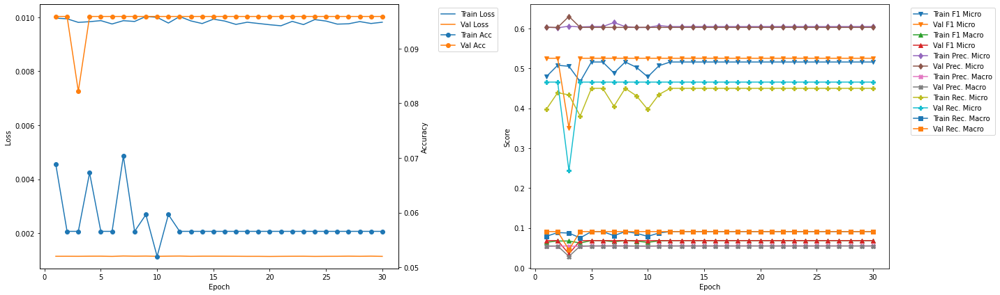

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.86
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4845 	Validation F1 Micro: 0.5405
Train F1 Marco: 0.065 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6027 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4051 	Validation Recall Micro: 0.4813
Train Recall Marco: 0.0812 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.98
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5043 	Validation F1 Micro: 0.5405
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6049 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4324 	Valid

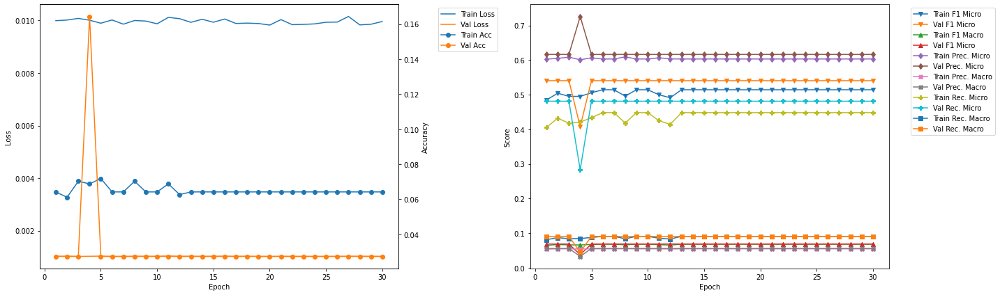

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.58
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0734 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4905 	Validation F1 Micro: 0.5301
Train F1 Marco: 0.0658 	Validation F1 Macro: 0.068
Train Precision Mirco: 0.6103 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.41 	Validation Recall Micro: 0.4731
Train Recall Marco: 0.0821 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.71
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5145 	Validation F1 Micro: 0.5301
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.068
Train Precision Mirco: 0.6041 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.448 	Validat

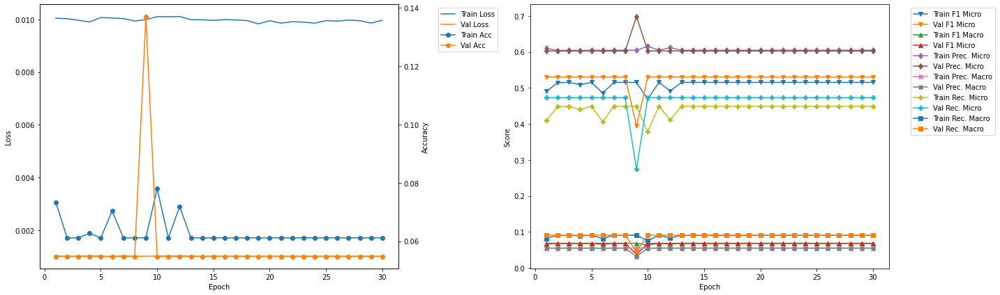

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.32
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5182 	Validation F1 Micro: 0.4653
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0626
Train Precision Mirco: 0.614 	Validation Precision Micro: 0.5347
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.4483 	Validation Recall Micro: 0.4118
Train Recall Marco: 0.0893 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.45
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5055 	Validation F1 Micro: 0.4653
Train F1 Marco: 0.0672 	Validation F1 Macro: 0.0626
Train Precision Mirco: 0.613 	Validation Precision Micro: 0.5347
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.4301 	Val

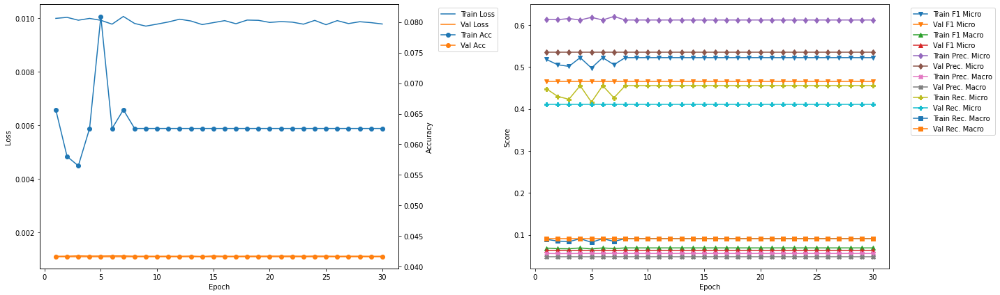

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.06
Train Loss: 0.0097 	Validation Loss: 0.0013
Train Accuracy: 0.0656 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.4966 	Validation F1 Micro: 0.5041
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.6017 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.4228 	Validation Recall Micro: 0.4133
Train Recall Marco: 0.0834 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.18
Train Loss: 0.0096 	Validation Loss: 0.0013
Train Accuracy: 0.0702 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.4995 	Validation F1 Micro: 0.5041
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.6127 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.42

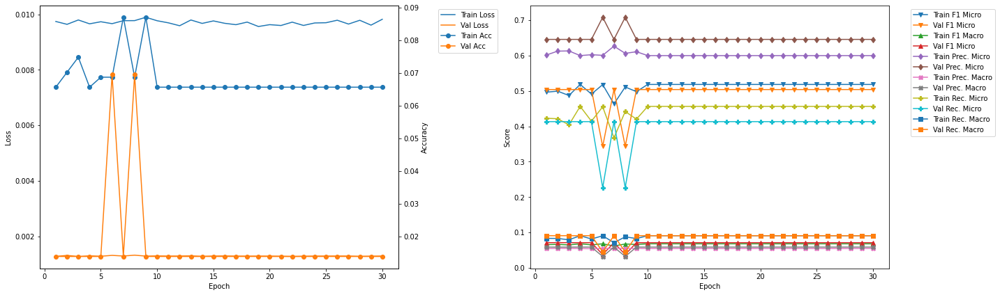

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.8
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0641 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5131 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0652
Train Precision Mirco: 0.6093 	Validation Precision Micro: 0.5625
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4431 	Validation Recall Micro: 0.45
Train Recall Marco: 0.089 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.92
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0595 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5035 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0669 	Validation F1 Macro: 0.0652
Train Precision Mirco: 0.6048 	Validation Precision Micro: 0.5625
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4312 	Validat

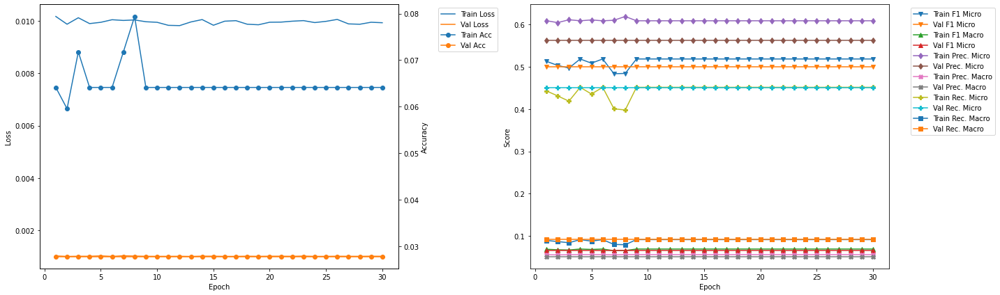

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 1 	Epoch: 6
Train Loss: 0.0114 	Validation Loss: 0.0012
Train Accuracy: 0.0 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.5527
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0724
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.6644
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0604
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.4732
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0909


In [19]:
resnet18LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = resnet18LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet18LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.14
Train Loss: 0.0159 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0031 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0385 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0065 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0021 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.28
Train Loss: 0.0128 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

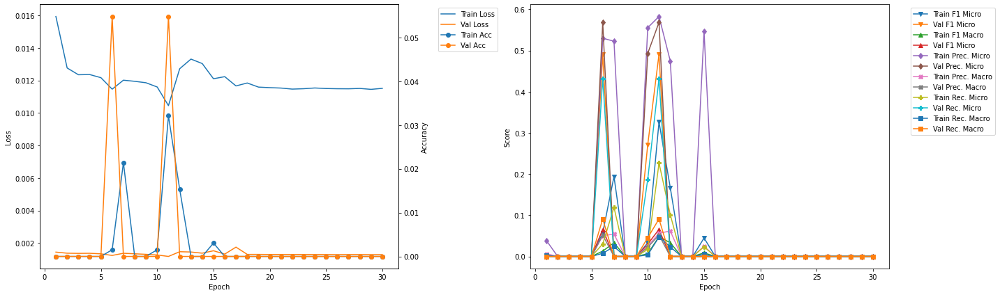

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.35
Train Loss: 0.0133 	Validation Loss: 0.0013
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0146 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0031 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.52 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0236 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0074 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0017 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.49
Train Loss: 0.0117 	Validation Loss: 0.0012
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0005 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0227 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0
Train Reca

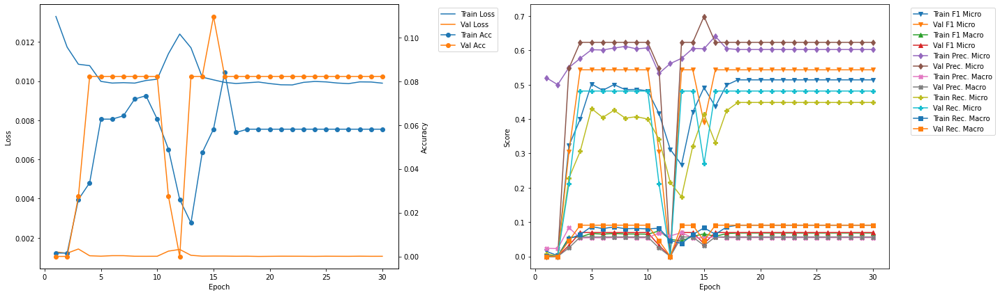

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.55
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4671 	Validation F1 Micro: 0.5257
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.6094 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.073 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.3787 	Validation Recall Micro: 0.451
Train Recall Marco: 0.0756 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.69
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4907 	Validation F1 Micro: 0.361
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.037
Train Precision Mirco: 0.6005 	Validation Precision Micro: 0.6849
Train Precision Marco: 0.054 	Validation Precision Macro: 0.0311
Train Recall Mirco: 0.4148 	Val

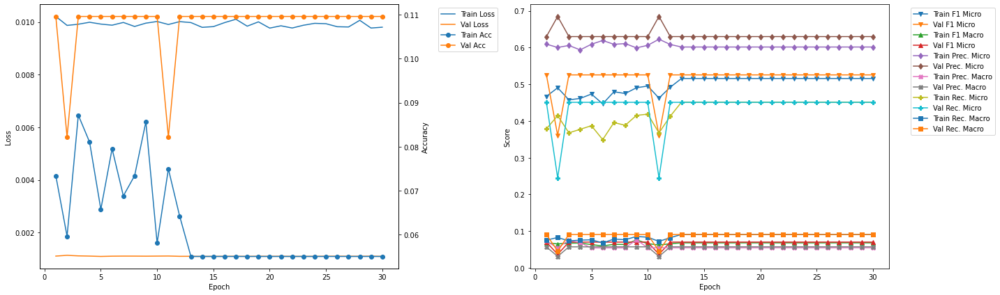

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.543284 --> 0.550296).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 12.75
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0872 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4757 	Validation F1 Micro: 0.5503
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.07
Train Precision Mirco: 0.6146 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0736 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.388 	Validation Recall Micro: 0.4844
Train Recall Marco: 0.0781 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.89
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.484 	Validation F1 Micro: 0.5503
Train F1 Marco: 0.0649 	Validation F1 Macro: 0.07
Train Precision Mirco: 0.601 	Validation Precision Micro: 0.637
Train Precision Mar

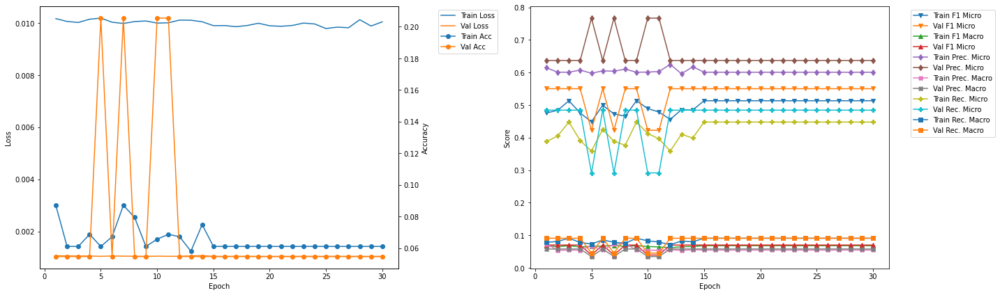

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 16.94
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0719 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.504 	Validation F1 Micro: 0.4675
Train F1 Marco: 0.0735 	Validation F1 Macro: 0.0636
Train Precision Mirco: 0.6107 	Validation Precision Micro: 0.5411
Train Precision Marco: 0.078 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.4291 	Validation Recall Micro: 0.4115
Train Recall Marco: 0.0863 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.08
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4899 	Validation F1 Micro: 0.3321
Train F1 Marco: 0.0654 	Validation F1 Macro: 0.0342
Train Precision Mirco: 0.6181 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0274
Train Recall Mirco: 0.4057

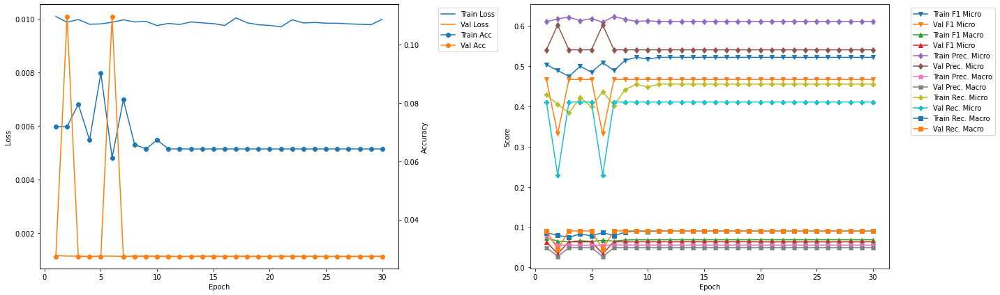

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.14
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.4959 	Validation F1 Micro: 0.3852
Train F1 Marco: 0.0748 	Validation F1 Macro: 0.0378
Train Precision Mirco: 0.5872 	Validation Precision Micro: 0.7123
Train Precision Marco: 0.0712 	Validation Precision Macro: 0.0324
Train Recall Mirco: 0.4291 	Validation Recall Micro: 0.264
Train Recall Marco: 0.0882 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.28
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4745 	Validation F1 Micro: 0.5423
Train F1 Marco: 0.0636 	Validation F1 Macro: 0.0705
Train Precision Mirco: 0.6037 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0539 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.3909 	V

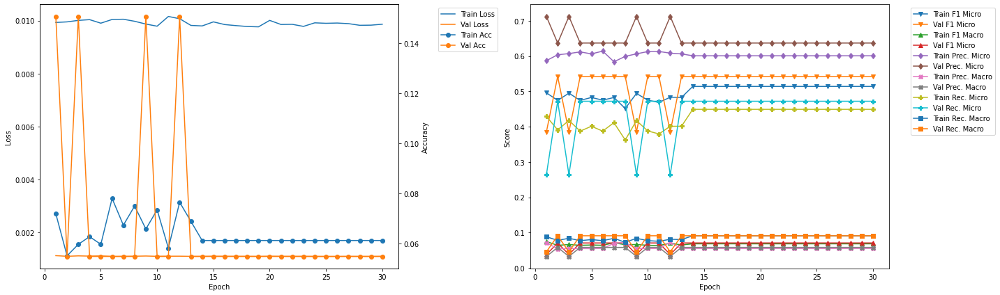

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.34
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.481 	Validation F1 Micro: 0.5154
Train F1 Marco: 0.0644 	Validation F1 Macro: 0.0701
Train Precision Mirco: 0.6173 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.394 	Validation Recall Micro: 0.436
Train Recall Marco: 0.0776 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.48
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5171 	Validation F1 Micro: 0.5154
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0701
Train Precision Mirco: 0.6017 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.4533 

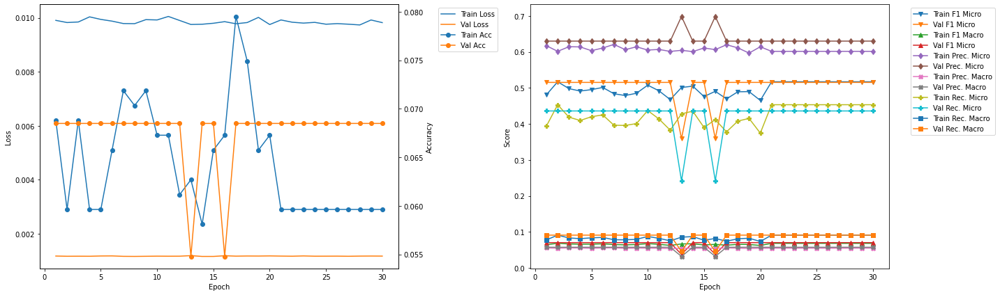

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.54
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4682 	Validation F1 Micro: 0.3643
Train F1 Marco: 0.0632 	Validation F1 Macro: 0.0359
Train Precision Mirco: 0.5974 	Validation Precision Micro: 0.6528
Train Precision Marco: 0.0992 	Validation Precision Macro: 0.0297
Train Recall Mirco: 0.385 	Validation Recall Micro: 0.2527
Train Recall Marco: 0.0761 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.68
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4814 	Validation F1 Micro: 0.503
Train F1 Marco: 0.0645 	Validation F1 Macro: 0.0662
Train Precision Mirco: 0.6141 	Validation Precision Micro: 0.5764
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0524
Train Recall Mirco: 0.3958 	

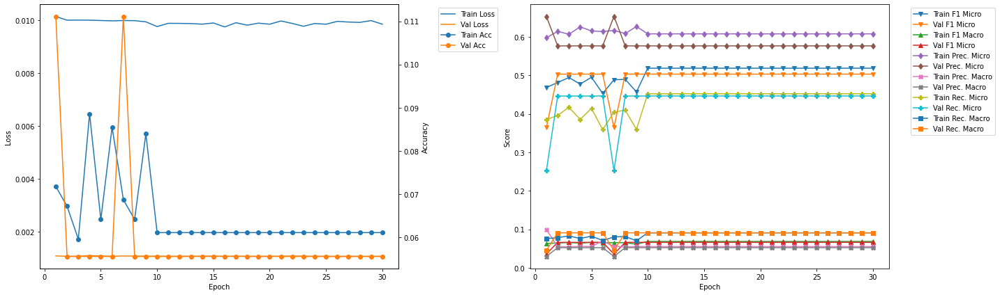

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.73
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.5022 	Validation F1 Micro: 0.3616
Train F1 Marco: 0.0668 	Validation F1 Macro: 0.0368
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.6806
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0309
Train Recall Mirco: 0.4314 	Validation Recall Micro: 0.2462
Train Recall Marco: 0.0869 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.87
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4631 	Validation F1 Micro: 0.5481
Train F1 Marco: 0.062 	Validation F1 Macro: 0.0718
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.6528
Train Precision Marco: 0.0535 	Validation Precision Macro: 0.0593
Train Recall Mirco: 0.3753 	V

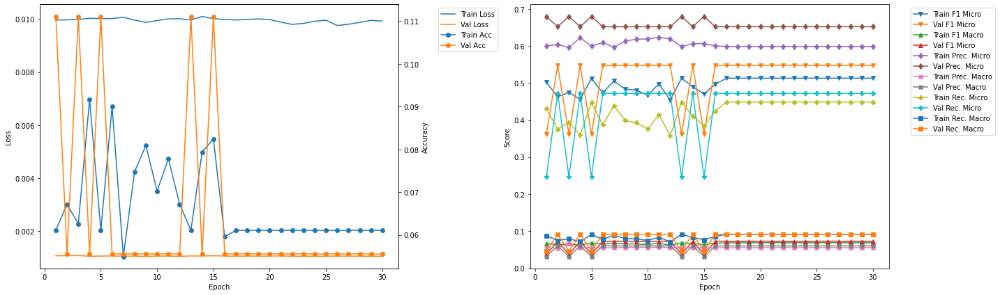

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.93
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4853 	Validation F1 Micro: 0.2957
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.0314
Train Precision Mirco: 0.6194 	Validation Precision Micro: 0.5278
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.024
Train Recall Mirco: 0.399 	Validation Recall Micro: 0.2054
Train Recall Marco: 0.0784 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.07
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0718 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4853 	Validation F1 Micro: 0.4802
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.0644
Train Precision Mirco: 0.6194 	Validation Precision Micro: 0.5486
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0499
Train Recall Mirco: 0.399

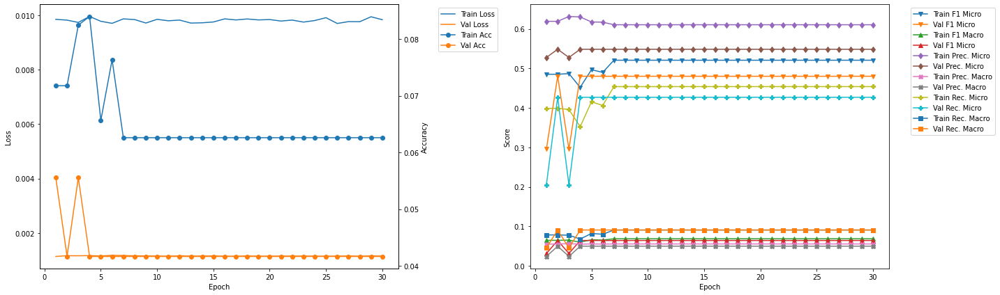

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 1
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0872 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4757 	Validation F1 Micro: 0.5503
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.07
Train Precision Mirco: 0.6146 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0736 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.388 	Validation Recall Micro: 0.4844
Train Recall Marco: 0.0781 	Validation Recall Macro: 0.0909


In [20]:
resnet50LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = resnet50LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet50LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.017 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0609 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0412 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1357 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1262 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0392 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0383 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.32
Train Loss: 0.0124 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

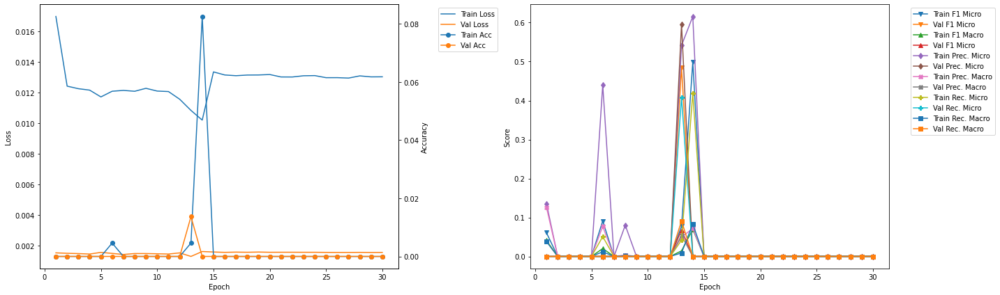

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.91
Train Loss: 0.0135 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.07
Train Loss: 0.0132 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

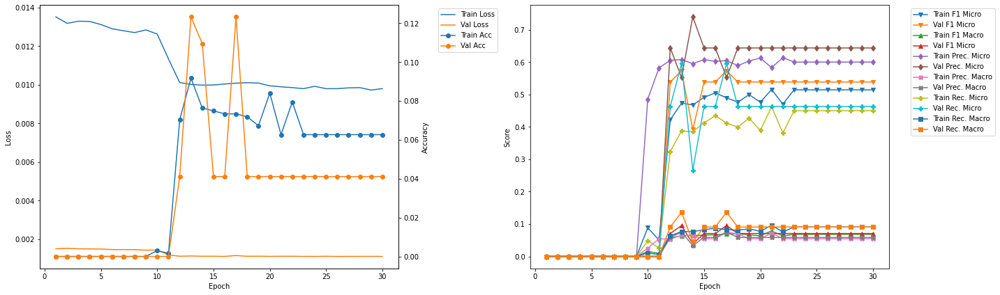

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.67
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0749 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5127 	Validation F1 Micro: 0.4457
Train F1 Marco: 0.0751 	Validation F1 Macro: 0.0622
Train Precision Mirco: 0.6064 	Validation Precision Micro: 0.5205
Train Precision Marco: 0.0734 	Validation Precision Macro: 0.0473
Train Recall Mirco: 0.4441 	Validation Recall Micro: 0.3897
Train Recall Marco: 0.0892 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.83
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0596 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4954 	Validation F1 Micro: 0.4457
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0622
Train Precision Mirco: 0.6145 	Validation Precision Micro: 0.5205
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0473
Train Recall Mirco: 0.415 	V

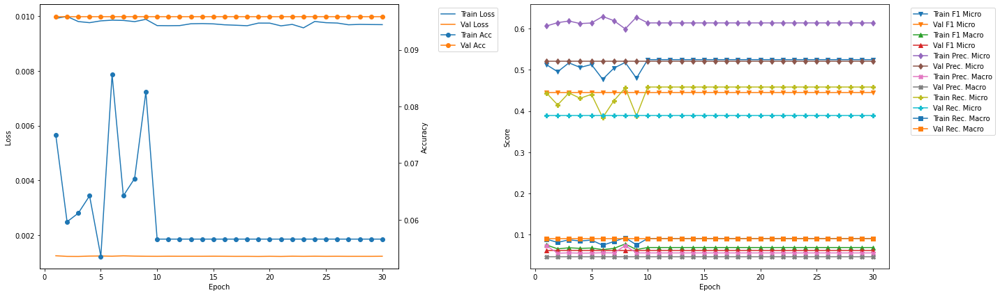

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.42
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.484 	Validation F1 Micro: 0.5376
Train F1 Marco: 0.067 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.5993 	Validation Precision Micro: 0.637
Train Precision Marco: 0.067 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.4058 	Validation Recall Micro: 0.465
Train Recall Marco: 0.0813 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.57
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5146 	Validation F1 Micro: 0.5376
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.6009 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.4499 	Va

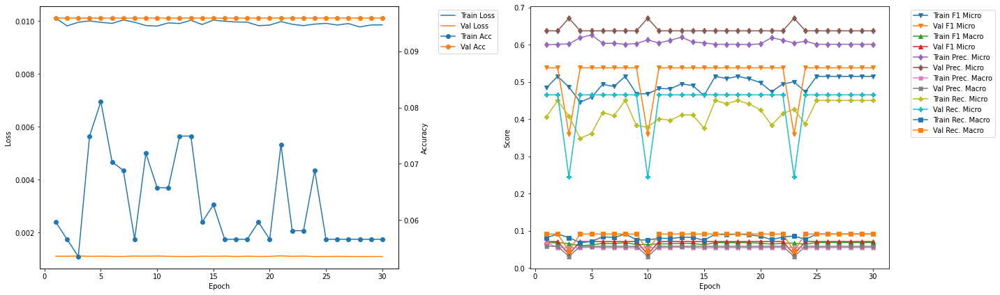

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.18
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5098 	Validation F1 Micro: 0.5299
Train F1 Marco: 0.0675 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.6009 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.4426 	Validation Recall Micro: 0.4537
Train Recall Marco: 0.089 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.34
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5154 	Validation F1 Micro: 0.5299
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.6009 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.4512 

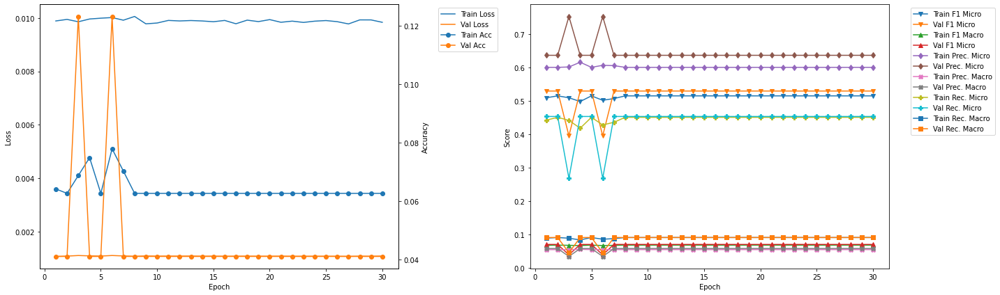

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.92
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0581 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.5076 	Validation F1 Micro: 0.4138
Train F1 Marco: 0.0675 	Validation F1 Macro: 0.0387
Train Precision Mirco: 0.6028 	Validation Precision Micro: 0.7397
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0336
Train Recall Mirco: 0.4383 	Validation Recall Micro: 0.2872
Train Recall Marco: 0.0884 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.08
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0795 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4744 	Validation F1 Micro: 0.5269
Train F1 Marco: 0.0643 	Validation F1 Macro: 0.0675
Train Precision Mirco: 0.6124 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0662 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.3872 

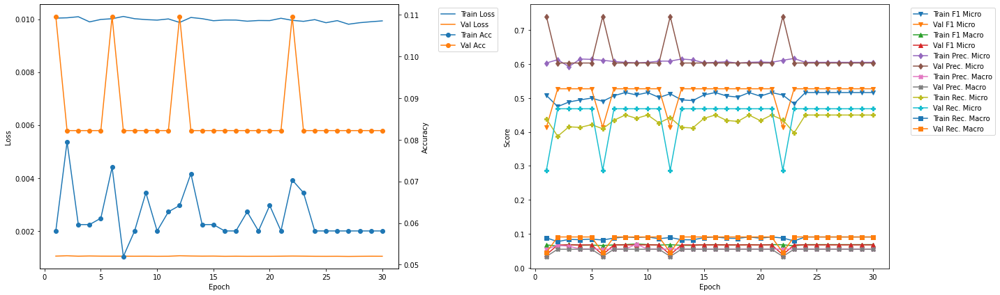

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.66
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0673 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4863 	Validation F1 Micro: 0.5251
Train F1 Marco: 0.0654 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.6196 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4002 	Validation Recall Micro: 0.4611
Train Recall Marco: 0.0796 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.82
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.516 	Validation F1 Micro: 0.5251
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.604 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4504 	

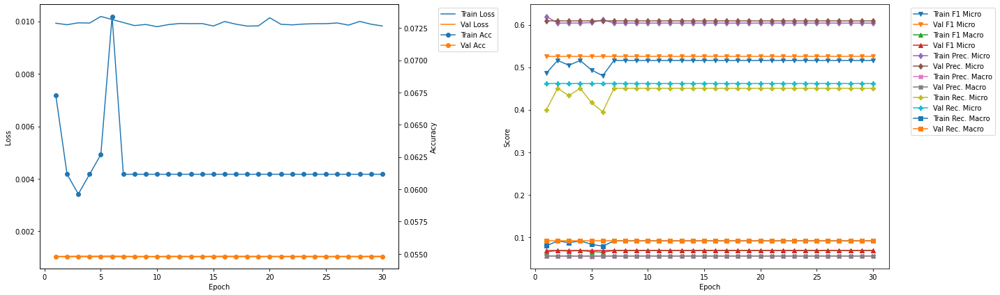

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.41
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0672 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4619 	Validation F1 Micro: 0.5478
Train F1 Marco: 0.0644 	Validation F1 Macro: 0.0678
Train Precision Mirco: 0.6092 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.0657 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.372 	Validation Recall Micro: 0.5059
Train Recall Marco: 0.0743 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.57
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5138 	Validation F1 Micro: 0.5478
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0678
Train Precision Mirco: 0.6053 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4463 	Val

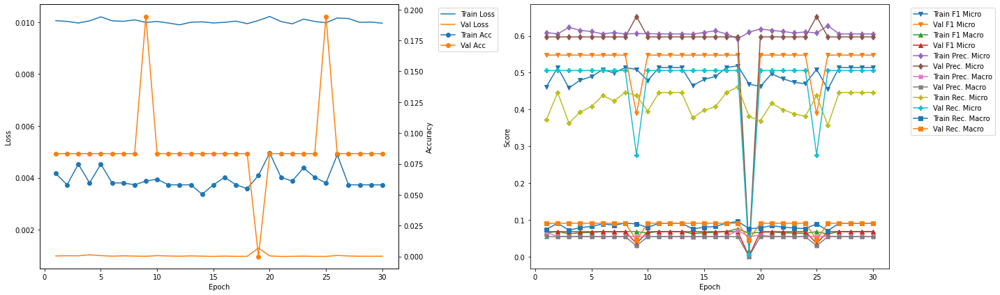

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.15
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5072 	Validation F1 Micro: 0.5285
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6146 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.4317 	Validation Recall Micro: 0.4656
Train Recall Marco: 0.0868 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.3
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5156 	Validation F1 Micro: 0.5285
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6038 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.4499 

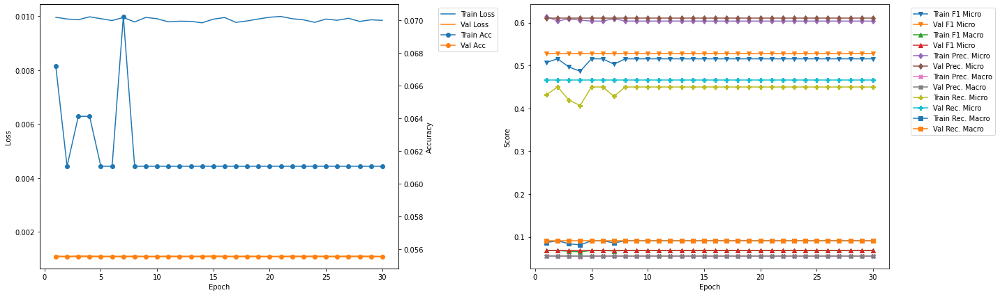

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.89
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4922 	Validation F1 Micro: 0.5075
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0675
Train Precision Mirco: 0.6033 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4157 	Validation Recall Micro: 0.445
Train Recall Marco: 0.0826 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 43.05
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4897 	Validation F1 Micro: 0.5075
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0675
Train Precision Mirco: 0.6155 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.40

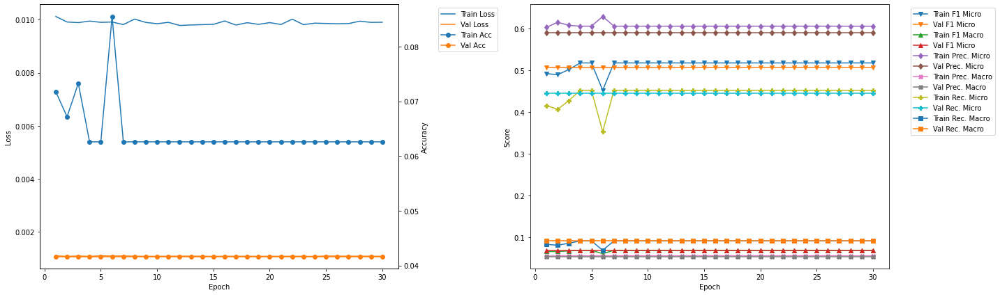

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 2 	Epoch: 13
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0917 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4734 	Validation F1 Micro: 0.5735
Train F1 Marco: 0.0639 	Validation F1 Macro: 0.0954
Train Precision Mirco: 0.6079 	Validation Precision Micro: 0.5525
Train Precision Marco: 0.0657 	Validation Precision Macro: 0.0753
Train Recall Mirco: 0.3876 	Validation Recall Micro: 0.5961
Train Recall Marco: 0.077 	Validation Recall Macro: 0.1364


In [21]:
resnet101LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = resnet101LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet101LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.15
Train Loss: 0.0206 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1015 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0704 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1441 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1346 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0784 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0816 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.29
Train Loss: 0.0127 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

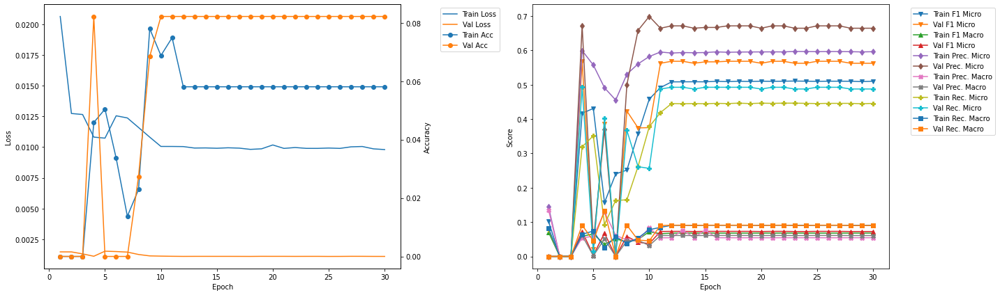

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.57
Train Loss: 0.0111 	Validation Loss: 0.0012
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4016 	Validation F1 Micro: 0.3369
Train F1 Marco: 0.0669 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.557 	Validation Precision Micro: 0.6351
Train Precision Marco: 0.0712 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.314 	Validation Recall Micro: 0.2293
Train Recall Marco: 0.0655 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.72
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0489 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.407 	Validation F1 Micro: 0.5284
Train F1 Marco: 0.0958 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.5616 	Validation Precision Micro: 0.6327
Train Precision Marco: 0.1567 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.3192 	V

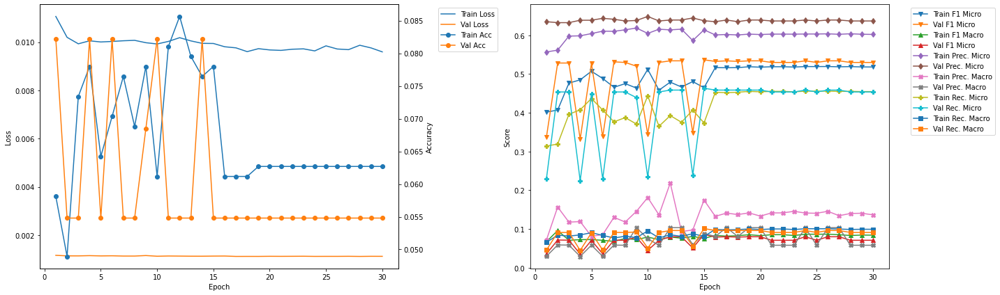

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.99
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4834 	Validation F1 Micro: 0.4926
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.1101
Train Precision Mirco: 0.6067 	Validation Precision Micro: 0.5724
Train Precision Marco: 0.0816 	Validation Precision Macro: 0.1424
Train Recall Mirco: 0.4017 	Validation Recall Micro: 0.4323
Train Recall Marco: 0.0811 	Validation Recall Macro: 0.1192

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.14
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5226 	Validation F1 Micro: 0.4824
Train F1 Marco: 0.0791 	Validation F1 Macro: 0.1104
Train Precision Mirco: 0.6071 	Validation Precision Micro: 0.5541
Train Precision Marco: 0.101 	Validation Precision Macro: 0.1353
Train Recall Mirco: 0.4587 	V

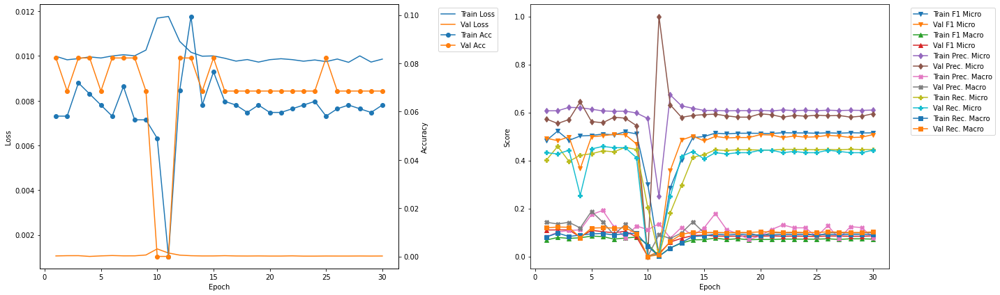

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 13.4
Train Loss: 0.0126 	Validation Loss: 0.0017
Train Accuracy: 0.0199 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1979 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0516 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4789 	Validation Precision Micro: 0.0
Train Precision Marco: 0.179 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1247 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0376 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.55
Train Loss: 0.0116 	Validation Loss: 0.0014
Train Accuracy: 0.0336 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.1672 	Validation F1 Micro: 0.2899
Train F1 Marco: 0.0352 	Validation F1 Macro: 0.0357
Train Precision Mirco: 0.5446 	Validation Precision Micro: 0.6557
Train Precision Marco: 0.1163 	Validation Precision Macro: 0.0771
Train Recall Mirco: 0.0987 	Validation Recall M

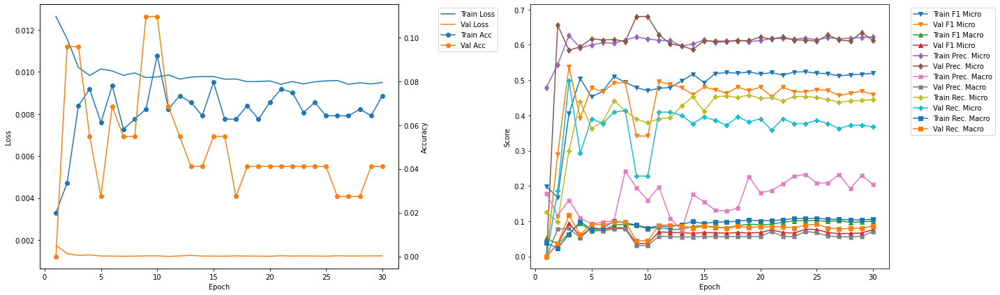

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.82
Train Loss: 0.0118 	Validation Loss: 0.001
Train Accuracy: 0.0428 	Validation Accuracy: 0.1644
Train F1 Mirco: 0.34 	Validation F1 Micro: 0.416
Train F1 Marco: 0.0886 	Validation F1 Macro: 0.0535
Train Precision Mirco: 0.5197 	Validation Precision Micro: 0.6842
Train Precision Marco: 0.2147 	Validation Precision Macro: 0.0614
Train Recall Mirco: 0.2527 	Validation Recall Micro: 0.2989
Train Recall Marco: 0.0707 	Validation Recall Macro: 0.0568

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.97
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0719 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4674 	Validation F1 Micro: 0.5309
Train F1 Marco: 0.0834 	Validation F1 Macro: 0.081
Train Precision Mirco: 0.6184 	Validation Precision Micro: 0.5733
Train Precision Marco: 0.1458 	Validation Precision Macro: 0.075
Train Recall Mirco: 0.3756 	Valid

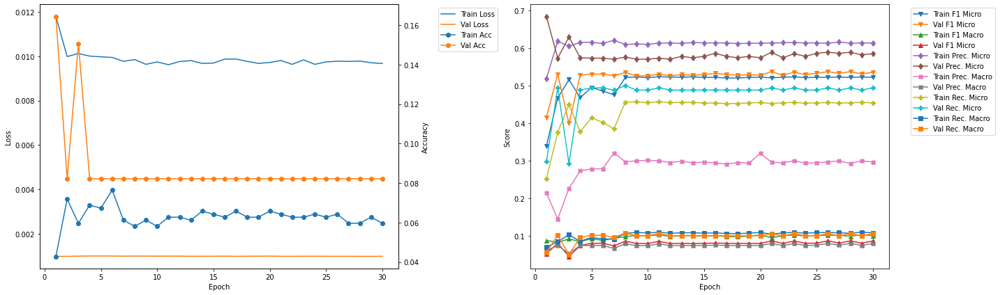

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.24
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0826 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4941 	Validation F1 Micro: 0.3359
Train F1 Marco: 0.0975 	Validation F1 Macro: 0.0428
Train Precision Mirco: 0.6131 	Validation Precision Micro: 0.5714
Train Precision Marco: 0.2551 	Validation Precision Macro: 0.073
Train Recall Mirco: 0.4137 	Validation Recall Micro: 0.2378
Train Recall Marco: 0.0966 	Validation Recall Macro: 0.0485

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.39
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0841 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4882 	Validation F1 Micro: 0.3889
Train F1 Marco: 0.0948 	Validation F1 Macro: 0.0596
Train Precision Mirco: 0.6275 	Validation Precision Micro: 0.5437
Train Precision Marco: 0.2235 	Validation Precision Macro: 0.0629
Train Recall Mirco: 0.399

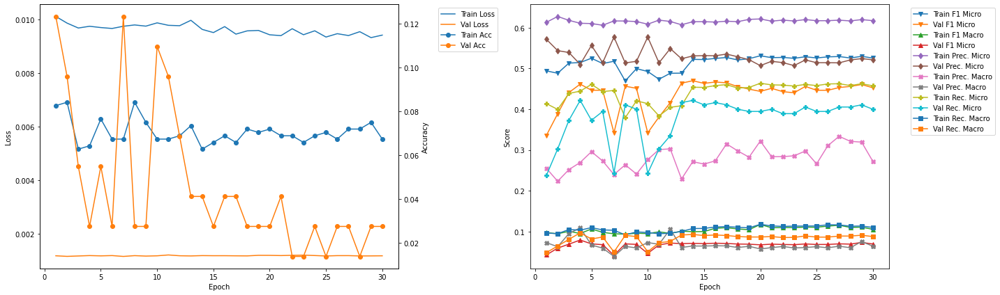

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.66
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.078 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.49 	Validation F1 Micro: 0.363
Train F1 Marco: 0.1029 	Validation F1 Macro: 0.0976
Train Precision Mirco: 0.6098 	Validation Precision Micro: 0.6543
Train Precision Marco: 0.2712 	Validation Precision Macro: 0.166
Train Recall Mirco: 0.4096 	Validation Recall Micro: 0.2512
Train Recall Marco: 0.1012 	Validation Recall Macro: 0.0991

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.8
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0856 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4809 	Validation F1 Micro: 0.3784
Train F1 Marco: 0.0979 	Validation F1 Macro: 0.1019
Train Precision Mirco: 0.6141 	Validation Precision Micro: 0.6588
Train Precision Marco: 0.2716 	Validation Precision Macro: 0.205
Train Recall Mirco: 0.3952 	Valid

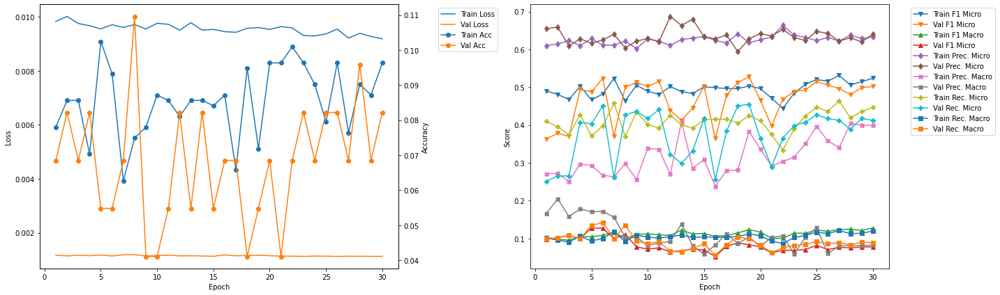

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.07
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0824 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.5084 	Validation F1 Micro: 0.4318
Train F1 Marco: 0.1163 	Validation F1 Macro: 0.0617
Train Precision Mirco: 0.6268 	Validation Precision Micro: 0.7125
Train Precision Marco: 0.3859 	Validation Precision Macro: 0.0919
Train Recall Mirco: 0.4277 	Validation Recall Micro: 0.3098
Train Recall Marco: 0.11 	Validation Recall Macro: 0.0616

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.21
Train Loss: 0.0096 	Validation Loss: 0.001
Train Accuracy: 0.0809 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.5024 	Validation F1 Micro: 0.513
Train F1 Marco: 0.1228 	Validation F1 Macro: 0.066
Train Precision Mirco: 0.6294 	Validation Precision Micro: 0.6371
Train Precision Marco: 0.3509 	Validation Precision Macro: 0.0574
Train Recall Mirco: 0.418 	Val

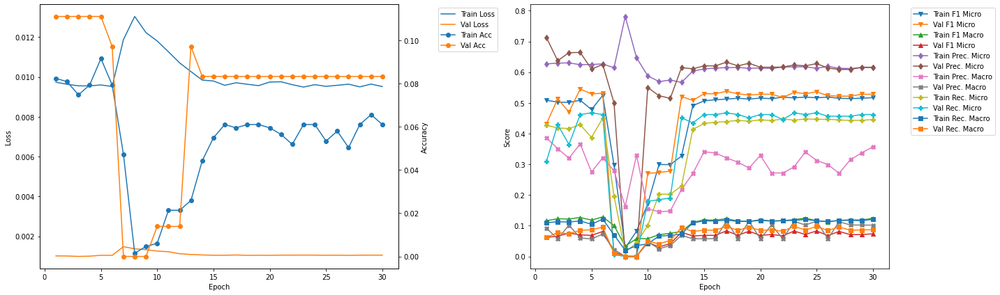

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 35.49
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0473 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.389 	Validation F1 Micro: 0.4753
Train F1 Marco: 0.0959 	Validation F1 Macro: 0.0991
Train Precision Mirco: 0.5719 	Validation Precision Micro: 0.5878
Train Precision Marco: 0.1979 	Validation Precision Macro: 0.1347
Train Recall Mirco: 0.2948 	Validation Recall Micro: 0.399
Train Recall Marco: 0.0816 	Validation Recall Macro: 0.1029

Epoch 2 	Learning Rate: 0.01 	Time (min): 35.63
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.084 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.5009 	Validation F1 Micro: 0.519
Train F1 Marco: 0.1031 	Validation F1 Macro: 0.1165
Train Precision Mirco: 0.6211 	Validation Precision Micro: 0.5933
Train Precision Marco: 0.2301 	Validation Precision Macro: 0.1374
Train Recall Mirco: 0.4196 	Va

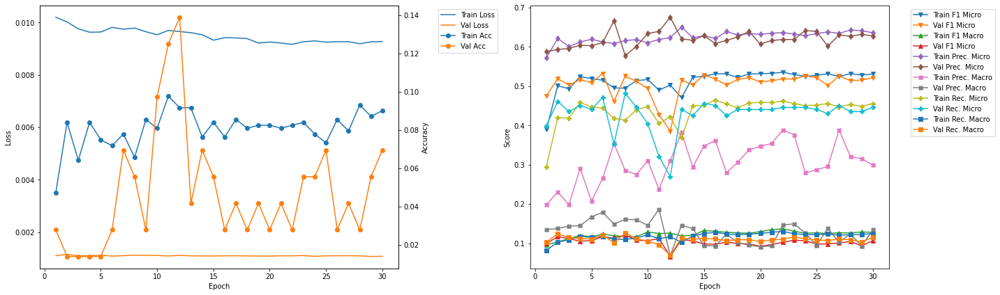

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.9
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0809 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5012 	Validation F1 Micro: 0.4669
Train F1 Marco: 0.1091 	Validation F1 Macro: 0.1435
Train Precision Mirco: 0.6096 	Validation Precision Micro: 0.5781
Train Precision Marco: 0.214 	Validation Precision Macro: 0.2395
Train Recall Mirco: 0.4255 	Validation Recall Micro: 0.3915
Train Recall Marco: 0.1074 	Validation Recall Macro: 0.1322

Epoch 2 	Learning Rate: 0.01 	Time (min): 40.05
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.084 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5029 	Validation F1 Micro: 0.5296
Train F1 Marco: 0.1251 	Validation F1 Macro: 0.1637
Train Precision Mirco: 0.6232 	Validation Precision Micro: 0.5663
Train Precision Marco: 0.3039 	Validation Precision Macro: 0.2378
Train Recall Mirco: 0.4215 

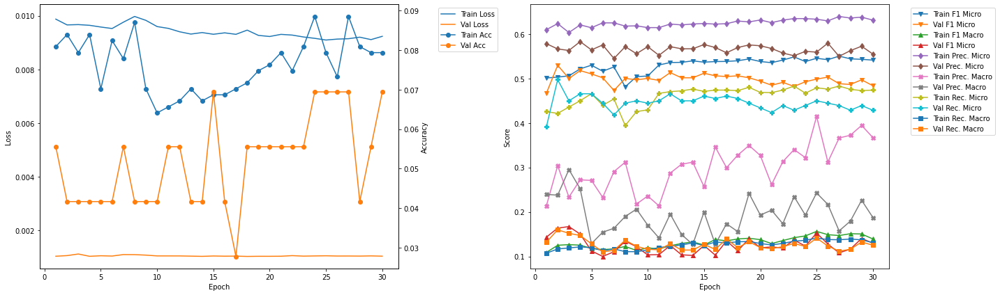

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 1 	Epoch: 4
Train Loss: 0.0108 	Validation Loss: 0.0011
Train Accuracy: 0.0459 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4166 	Validation F1 Micro: 0.5681
Train F1 Marco: 0.0589 	Validation F1 Macro: 0.073
Train Precision Mirco: 0.5994 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.061
Train Recall Mirco: 0.3192 	Validation Recall Micro: 0.4925
Train Recall Marco: 0.0644 	Validation Recall Macro: 0.0909


In [22]:
densenet121LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = densenet121LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet121LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0231 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0879 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0491 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1245 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1117 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.068 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0393 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.33
Train Loss: 0.0132 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

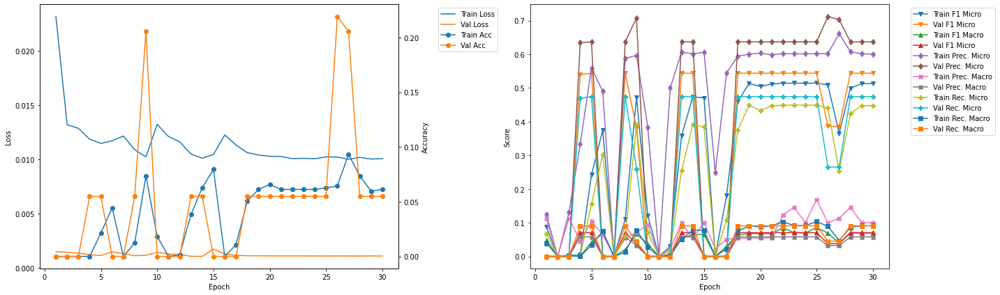

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.12
Train Loss: 0.0104 	Validation Loss: 0.0013
Train Accuracy: 0.0398 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4394 	Validation F1 Micro: 0.3579
Train F1 Marco: 0.0703 	Validation F1 Macro: 0.0522
Train Precision Mirco: 0.5849 	Validation Precision Micro: 0.6375
Train Precision Marco: 0.1581 	Validation Precision Macro: 0.0829
Train Recall Mirco: 0.3519 	Validation Recall Micro: 0.2488
Train Recall Marco: 0.0744 	Validation Recall Macro: 0.0556

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.28
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0902 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4868 	Validation F1 Micro: 0.4571
Train F1 Marco: 0.0759 	Validation F1 Macro: 0.0643
Train Precision Mirco: 0.6258 	Validation Precision Micro: 0.5517
Train Precision Marco: 0.1379 	Validation Precision Macro: 0.0512
Train Recall Mirco: 0.3984 	

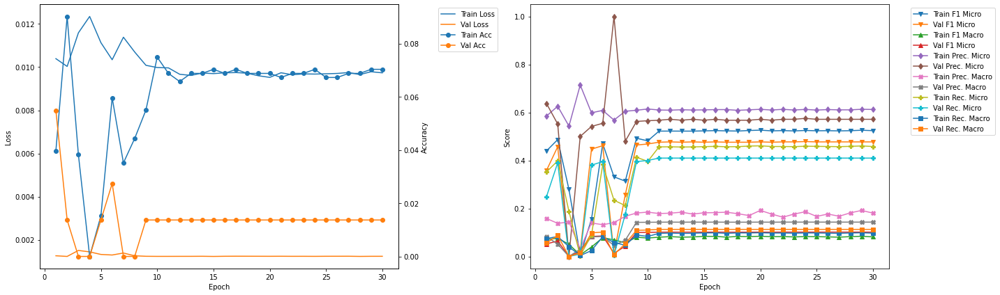

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.05
Train Loss: 0.0109 	Validation Loss: 0.0011
Train Accuracy: 0.0398 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.3653 	Validation F1 Micro: 0.3481
Train F1 Marco: 0.0661 	Validation F1 Macro: 0.0536
Train Precision Mirco: 0.5695 	Validation Precision Micro: 0.6267
Train Precision Marco: 0.1761 	Validation Precision Macro: 0.1189
Train Recall Mirco: 0.2688 	Validation Recall Micro: 0.241
Train Recall Marco: 0.0606 	Validation Recall Macro: 0.0561

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.21
Train Loss: 0.0113 	Validation Loss: 0.0013
Train Accuracy: 0.0413 	Validation Accuracy: 0.0
Train F1 Mirco: 0.3109 	Validation F1 Micro: 0.0203
Train F1 Marco: 0.0589 	Validation F1 Macro: 0.0189
Train Precision Mirco: 0.5719 	Validation Precision Micro: 1.0
Train Precision Marco: 0.1225 	Validation Precision Macro: 0.0909
Train Recall Mirco: 0.2135 	Val

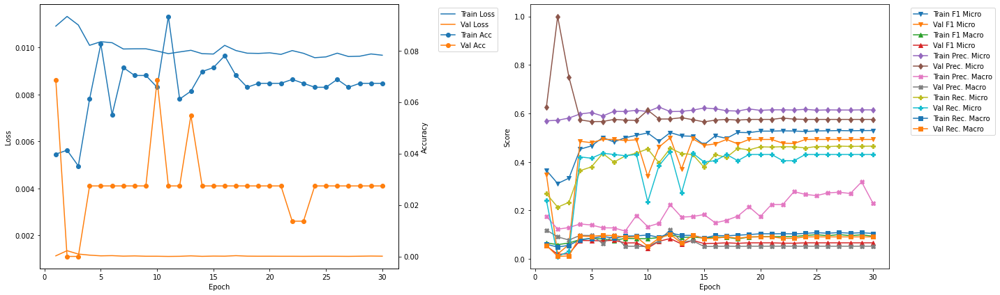

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.98
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.081 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4592 	Validation F1 Micro: 0.5192
Train F1 Marco: 0.0913 	Validation F1 Macro: 0.0812
Train Precision Mirco: 0.6216 	Validation Precision Micro: 0.5986
Train Precision Marco: 0.2202 	Validation Precision Macro: 0.1015
Train Recall Mirco: 0.3641 	Validation Recall Micro: 0.4583
Train Recall Marco: 0.0848 	Validation Recall Macro: 0.0945

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.14
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0856 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4699 	Validation F1 Micro: 0.5251
Train F1 Marco: 0.081 	Validation F1 Macro: 0.0912
Train Precision Mirco: 0.6153 	Validation Precision Micro: 0.6054
Train Precision Marco: 0.1797 	Validation Precision Macro: 0.1019
Train Recall Mirco: 0.3801 	Va

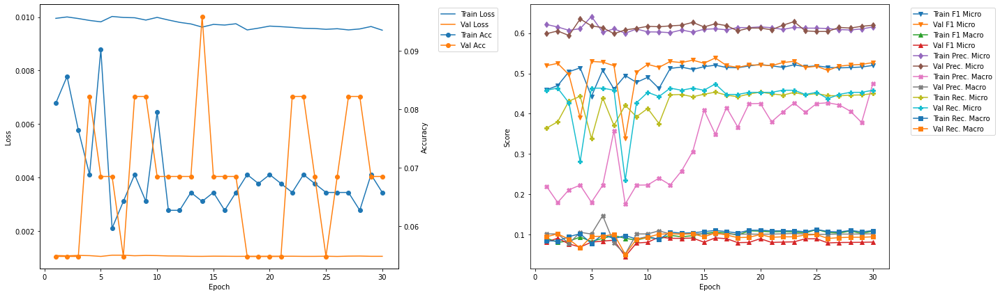

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.9
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0627 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4844 	Validation F1 Micro: 0.4467
Train F1 Marco: 0.0945 	Validation F1 Macro: 0.1313
Train Precision Mirco: 0.6029 	Validation Precision Micro: 0.5909
Train Precision Marco: 0.2578 	Validation Precision Macro: 0.1673
Train Recall Mirco: 0.4049 	Validation Recall Micro: 0.3591
Train Recall Marco: 0.0955 	Validation Recall Macro: 0.1252

Validation F1 Micro Score Increased (0.543860 --> 0.550633).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 20.08
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.1009 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4988 	Validation F1 Micro: 0.5506
Train F1 Marco: 0.1038 	Validation F1 Macro: 0.1459
Train Precision Mirco: 0.6186 	Validation Precision Micro: 0.6444
Train Precision

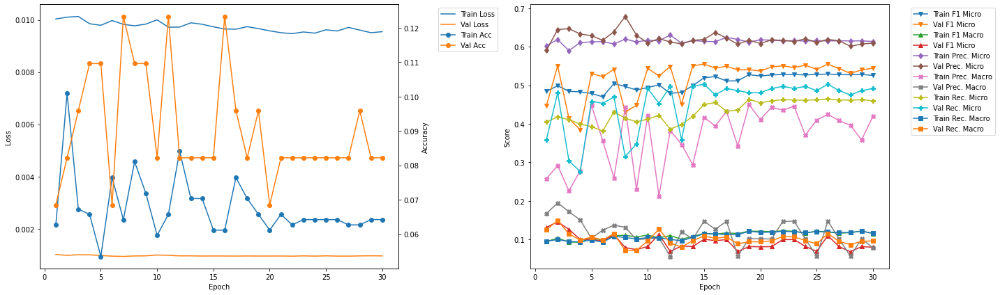

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.85
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4971 	Validation F1 Micro: 0.4762
Train F1 Marco: 0.1119 	Validation F1 Macro: 0.0734
Train Precision Mirco: 0.6195 	Validation Precision Micro: 0.6481
Train Precision Marco: 0.2939 	Validation Precision Macro: 0.1018
Train Recall Mirco: 0.4151 	Validation Recall Micro: 0.3763
Train Recall Marco: 0.105 	Validation Recall Macro: 0.0733

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.01
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0703 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5018 	Validation F1 Micro: 0.4967
Train F1 Marco: 0.1162 	Validation F1 Macro: 0.0766
Train Precision Mirco: 0.6143 	Validation Precision Micro: 0.6333
Train Precision Marco: 0.3844 	Validation Precision Macro: 0.1013
Train Recall Mirco: 0.4242 

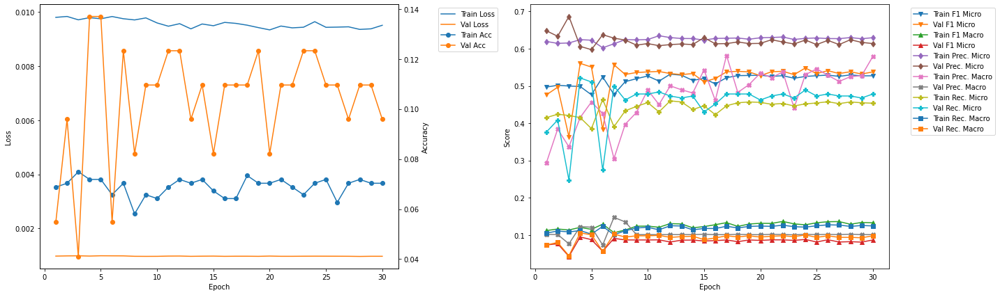

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.79
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5162 	Validation F1 Micro: 0.4824
Train F1 Marco: 0.1205 	Validation F1 Macro: 0.1271
Train Precision Mirco: 0.6211 	Validation Precision Micro: 0.5816
Train Precision Marco: 0.4688 	Validation Precision Macro: 0.1727
Train Recall Mirco: 0.4416 	Validation Recall Micro: 0.4121
Train Recall Marco: 0.1129 	Validation Recall Macro: 0.1268

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.95
Train Loss: 0.0095 	Validation Loss: 0.0012
Train Accuracy: 0.0734 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.5244 	Validation F1 Micro: 0.4812
Train F1 Marco: 0.1075 	Validation F1 Macro: 0.099
Train Precision Mirco: 0.6233 	Validation Precision Micro: 0.6364
Train Precision Marco: 0.335 	Validation Precision Macro: 0.147
Train Recall Mirco: 0.4525 

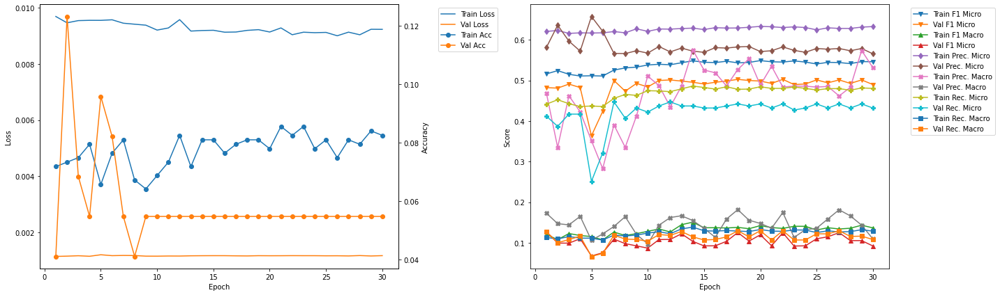

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.72
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0748 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4995 	Validation F1 Micro: 0.4581
Train F1 Marco: 0.1156 	Validation F1 Macro: 0.1016
Train Precision Mirco: 0.6093 	Validation Precision Micro: 0.6961
Train Precision Marco: 0.4155 	Validation Precision Macro: 0.144
Train Recall Mirco: 0.4232 	Validation Recall Micro: 0.3413
Train Recall Marco: 0.1085 	Validation Recall Macro: 0.0933

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.88
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0962 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4818 	Validation F1 Micro: 0.5299
Train F1 Marco: 0.1145 	Validation F1 Macro: 0.1018
Train Precision Mirco: 0.609 	Validation Precision Micro: 0.6503
Train Precision Marco: 0.3422 	Validation Precision Macro: 0.1502
Train Recall Mirco: 0.3985

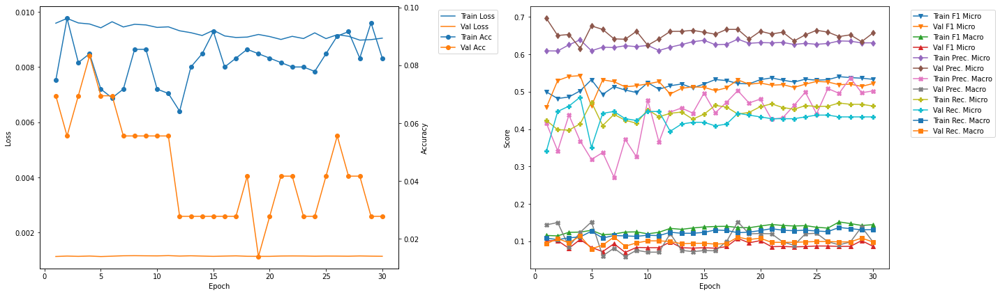

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.65
Train Loss: 0.0096 	Validation Loss: 0.0012
Train Accuracy: 0.0901 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.5055 	Validation F1 Micro: 0.5
Train F1 Marco: 0.1167 	Validation F1 Macro: 0.1527
Train Precision Mirco: 0.6308 	Validation Precision Micro: 0.585
Train Precision Marco: 0.3411 	Validation Precision Macro: 0.1744
Train Recall Mirco: 0.4217 	Validation Recall Micro: 0.4365
Train Recall Marco: 0.1079 	Validation Recall Macro: 0.1571

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.81
Train Loss: 0.0096 	Validation Loss: 0.0012
Train Accuracy: 0.0702 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5264 	Validation F1 Micro: 0.4944
Train F1 Marco: 0.1203 	Validation F1 Macro: 0.144
Train Precision Mirco: 0.6225 	Validation Precision Micro: 0.5535
Train Precision Marco: 0.3686 	Validation Precision Macro: 0.1824
Train Recall Mirco: 0.456 	Va

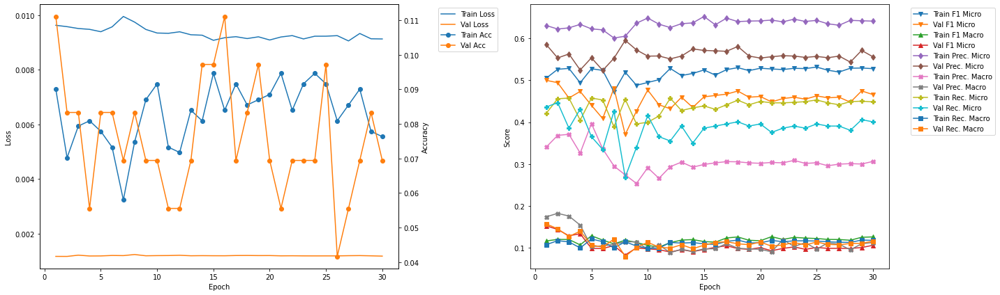

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.58
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0916 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.49 	Validation F1 Micro: 0.5382
Train F1 Marco: 0.1141 	Validation F1 Macro: 0.1054
Train Precision Mirco: 0.6273 	Validation Precision Micro: 0.5758
Train Precision Marco: 0.287 	Validation Precision Macro: 0.162
Train Recall Mirco: 0.4019 	Validation Recall Micro: 0.5053
Train Recall Marco: 0.1055 	Validation Recall Macro: 0.1148

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.74
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0763 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4924 	Validation F1 Micro: 0.5526
Train F1 Marco: 0.1168 	Validation F1 Macro: 0.1185
Train Precision Mirco: 0.6101 	Validation Precision Micro: 0.6345
Train Precision Marco: 0.2837 	Validation Precision Macro: 0.2385
Train Recall Mirco: 0.4127 

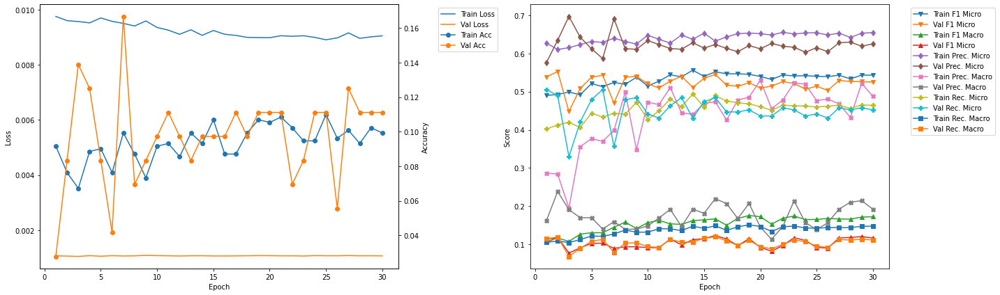

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 6 	Epoch: 4
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0719 	Validation Accuracy: 0.137
Train F1 Mirco: 0.4986 	Validation F1 Micro: 0.5607
Train F1 Marco: 0.1206 	Validation F1 Macro: 0.0947
Train Precision Mirco: 0.6243 	Validation Precision Micro: 0.6062
Train Precision Marco: 0.4155 	Validation Precision Macro: 0.1226
Train Recall Mirco: 0.4151 	Validation Recall Micro: 0.5215
Train Recall Marco: 0.1119 	Validation Recall Macro: 0.1057


In [23]:
densenet169LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = densenet169LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet169LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.18
Train Loss: 0.0226 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0863 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0552 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.141 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1273 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0621 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0676 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.36
Train Loss: 0.0137 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

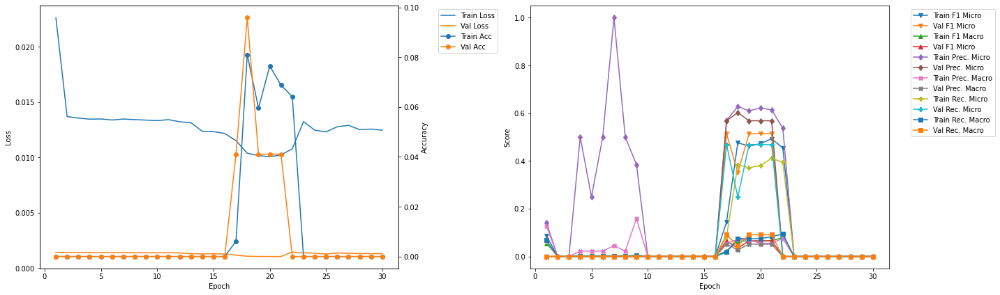

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.5
Train Loss: 0.0126 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0005 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0909 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0002 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.68
Train Loss: 0.0125 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0045 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0022 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1481 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0909 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0023 	Validation Recall Micro: 0.0
Train Recall Ma

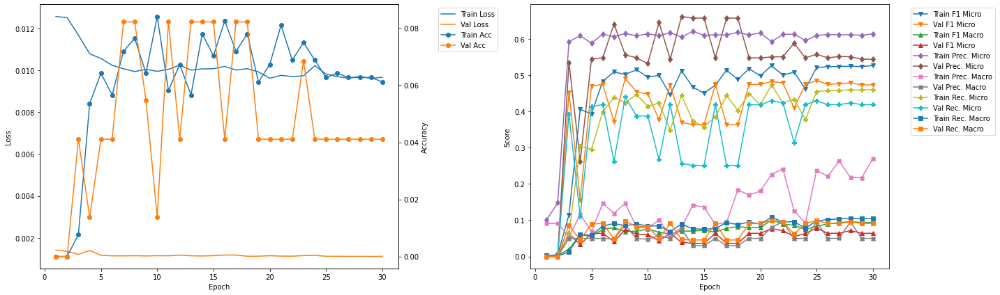

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.81
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4921 	Validation F1 Micro: 0.4942
Train F1 Marco: 0.0813 	Validation F1 Macro: 0.0857
Train Precision Mirco: 0.6174 	Validation Precision Micro: 0.5592
Train Precision Marco: 0.2036 	Validation Precision Macro: 0.0849
Train Recall Mirco: 0.4091 	Validation Recall Micro: 0.4427
Train Recall Marco: 0.0886 	Validation Recall Macro: 0.1039

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.99
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4869 	Validation F1 Micro: 0.4765
Train F1 Marco: 0.1054 	Validation F1 Macro: 0.0645
Train Precision Mirco: 0.5825 	Validation Precision Micro: 0.5473
Train Precision Marco: 0.2316 	Validation Precision Macro: 0.0519
Train Recall Mirco: 0.4182

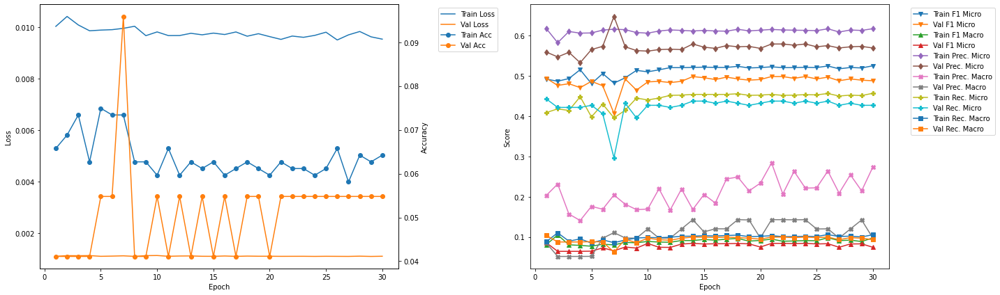

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.513932 --> 0.523256).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 16.13
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4779 	Validation F1 Micro: 0.5233
Train F1 Marco: 0.0856 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6026 	Validation Precision Micro: 0.6122
Train Precision Marco: 0.1768 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.396 	Validation Recall Micro: 0.4569
Train Recall Marco: 0.0885 	Validation Recall Macro: 0.0909

Validation F1 Micro Score Increased (0.523256 --> 0.536023).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 16.31
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4915 	Validation F1 Micro: 0.536
Train F1 Marco: 0.0882 	Validation F1 Macro: 0.0965
T

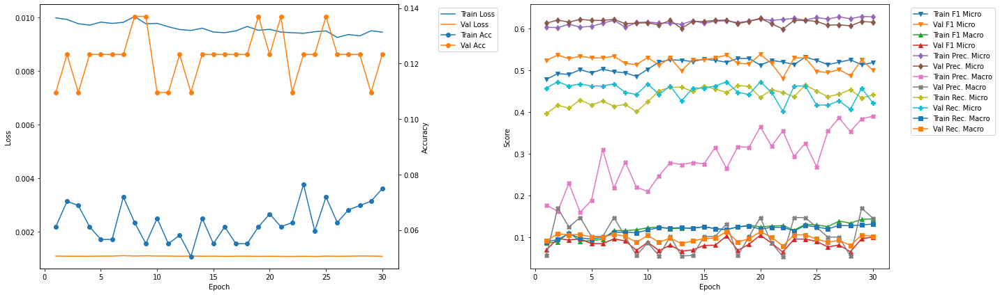

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.45
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5065 	Validation F1 Micro: 0.5138
Train F1 Marco: 0.1104 	Validation F1 Macro: 0.1263
Train Precision Mirco: 0.6084 	Validation Precision Micro: 0.6
Train Precision Marco: 0.2147 	Validation Precision Macro: 0.2118
Train Recall Mirco: 0.4339 	Validation Recall Micro: 0.4493
Train Recall Marco: 0.1114 	Validation Recall Macro: 0.1289

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.63
Train Loss: 0.0096 	Validation Loss: 0.0012
Train Accuracy: 0.0795 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5076 	Validation F1 Micro: 0.5056
Train F1 Marco: 0.1171 	Validation F1 Macro: 0.1219
Train Precision Mirco: 0.6137 	Validation Precision Micro: 0.5948
Train Precision Marco: 0.2439 	Validation Precision Macro: 0.2214
Train Recall Mirco: 0.4328 

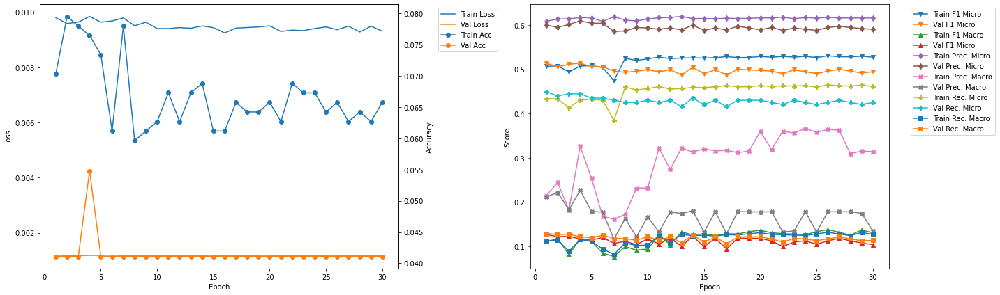

-------------------------------------------
FOLD 6
-------------------------------------------
Validation F1 Micro Score Increased (0.537572 --> 0.587896).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 26.77
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4659 	Validation F1 Micro: 0.5879
Train F1 Marco: 0.0854 	Validation F1 Macro: 0.1006
Train Precision Mirco: 0.6089 	Validation Precision Micro: 0.6846
Train Precision Marco: 0.2125 	Validation Precision Macro: 0.0982
Train Recall Mirco: 0.3774 	Validation Recall Micro: 0.5152
Train Recall Marco: 0.0868 	Validation Recall Macro: 0.1118

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.95
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0719 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5056 	Validation F1 Micro: 0.5848
Train F1 Marco: 0.1267 	Validation F1 Macro: 0.1046
Train Precision Mirco: 0.6024 	Validation Precision Micro: 0.6944
Train Precis

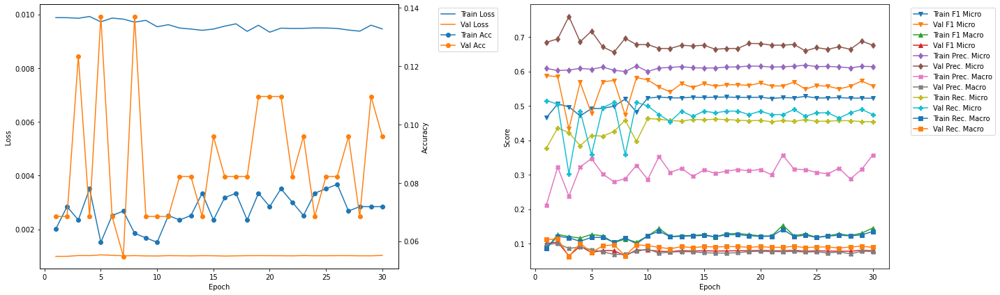

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 32.08
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5 	Validation F1 Micro: 0.5449
Train F1 Marco: 0.1074 	Validation F1 Macro: 0.0993
Train Precision Mirco: 0.6042 	Validation Precision Micro: 0.651
Train Precision Marco: 0.2762 	Validation Precision Macro: 0.1494
Train Recall Mirco: 0.4264 	Validation Recall Micro: 0.4686
Train Recall Marco: 0.1062 	Validation Recall Macro: 0.108

Epoch 2 	Learning Rate: 0.01 	Time (min): 32.26
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.5072 	Validation F1 Micro: 0.4892
Train F1 Marco: 0.1283 	Validation F1 Macro: 0.0987
Train Precision Mirco: 0.6092 	Validation Precision Micro: 0.681
Train Precision Marco: 0.2955 	Validation Precision Macro: 0.1356
Train Recall Mirco: 0.4345 	Va

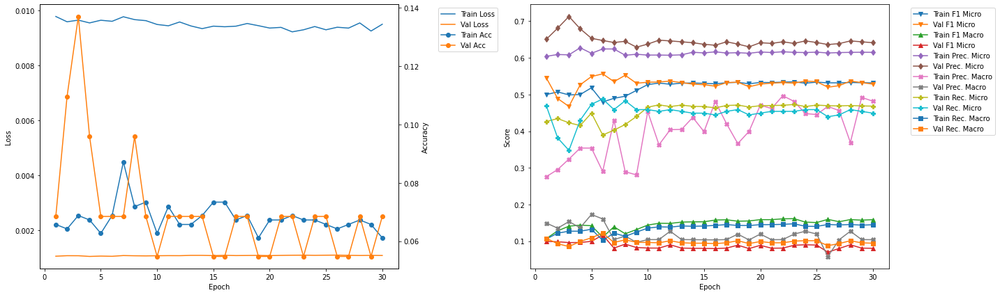

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.39
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5237 	Validation F1 Micro: 0.5119
Train F1 Marco: 0.15 	Validation F1 Macro: 0.1095
Train Precision Mirco: 0.6134 	Validation Precision Micro: 0.5621
Train Precision Marco: 0.3615 	Validation Precision Macro: 0.1879
Train Recall Mirco: 0.4569 	Validation Recall Micro: 0.4699
Train Recall Marco: 0.1371 	Validation Recall Macro: 0.1245

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.57
Train Loss: 0.0095 	Validation Loss: 0.0011
Train Accuracy: 0.0763 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5069 	Validation F1 Micro: 0.5045
Train F1 Marco: 0.1487 	Validation F1 Macro: 0.1009
Train Precision Mirco: 0.619 	Validation Precision Micro: 0.56
Train Precision Marco: 0.3723 	Validation Precision Macro: 0.1197
Train Recall Mirco: 0.4291 	V

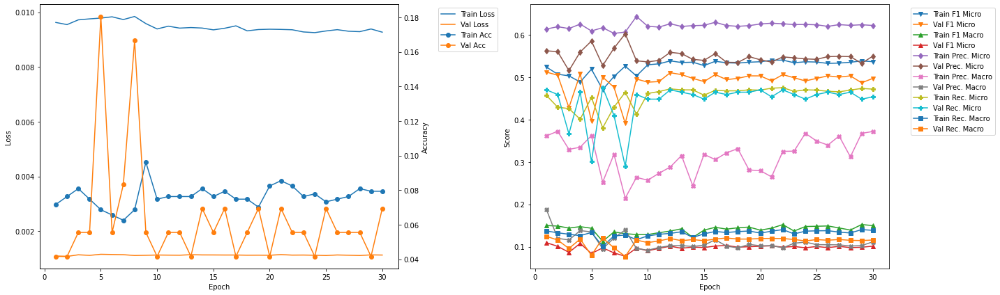

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.7
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0779 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4911 	Validation F1 Micro: 0.5673
Train F1 Marco: 0.1029 	Validation F1 Macro: 0.1562
Train Precision Mirco: 0.6073 	Validation Precision Micro: 0.6781
Train Precision Marco: 0.2156 	Validation Precision Macro: 0.2584
Train Recall Mirco: 0.4123 	Validation Recall Micro: 0.4877
Train Recall Marco: 0.1003 	Validation Recall Macro: 0.1506

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.88
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0809 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4887 	Validation F1 Micro: 0.5562
Train F1 Marco: 0.1061 	Validation F1 Macro: 0.1294
Train Precision Mirco: 0.6192 	Validation Precision Micro: 0.6963
Train Precision Marco: 0.2268 	Validation Precision Macro: 0.1991
Train Recall Mirco: 0.403

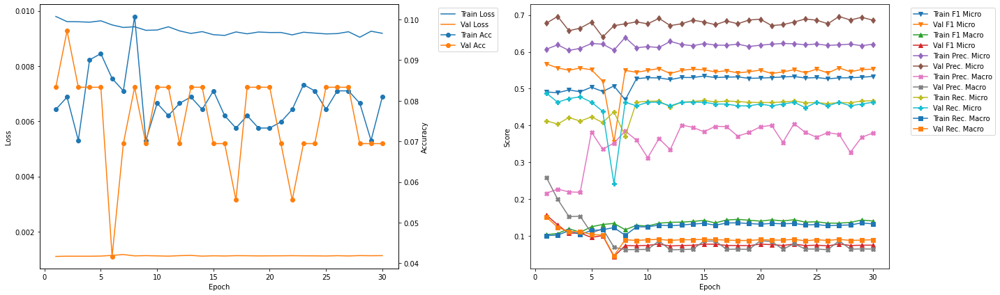

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 48.01
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0763 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5121 	Validation F1 Micro: 0.5094
Train F1 Marco: 0.1191 	Validation F1 Macro: 0.1541
Train Precision Mirco: 0.6093 	Validation Precision Micro: 0.6429
Train Precision Marco: 0.2525 	Validation Precision Macro: 0.2839
Train Recall Mirco: 0.4416 	Validation Recall Micro: 0.4219
Train Recall Marco: 0.1159 	Validation Recall Macro: 0.1364

Epoch 2 	Learning Rate: 0.01 	Time (min): 48.19
Train Loss: 0.0096 	Validation Loss: 0.001
Train Accuracy: 0.0855 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.499 	Validation F1 Micro: 0.5285
Train F1 Marco: 0.1179 	Validation F1 Macro: 0.1381
Train Precision Mirco: 0.6234 	Validation Precision Micro: 0.6241
Train Precision Marco: 0.2989 	Validation Precision Macro: 0.2388
Train Recall Mirco: 0.416 

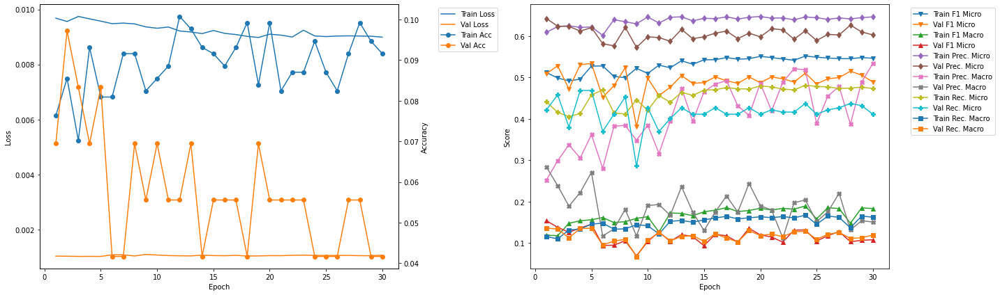

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 6 	Epoch: 1
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4659 	Validation F1 Micro: 0.5879
Train F1 Marco: 0.0854 	Validation F1 Macro: 0.1006
Train Precision Mirco: 0.6089 	Validation Precision Micro: 0.6846
Train Precision Marco: 0.2125 	Validation Precision Macro: 0.0982
Train Recall Mirco: 0.3774 	Validation Recall Micro: 0.5152
Train Recall Marco: 0.0868 	Validation Recall Macro: 0.1118


In [24]:
densenet201LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = densenet201LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet201LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.19
Train Loss: 0.0168 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0022 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0024 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.05 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0091 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0014 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.38
Train Loss: 0.0124 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

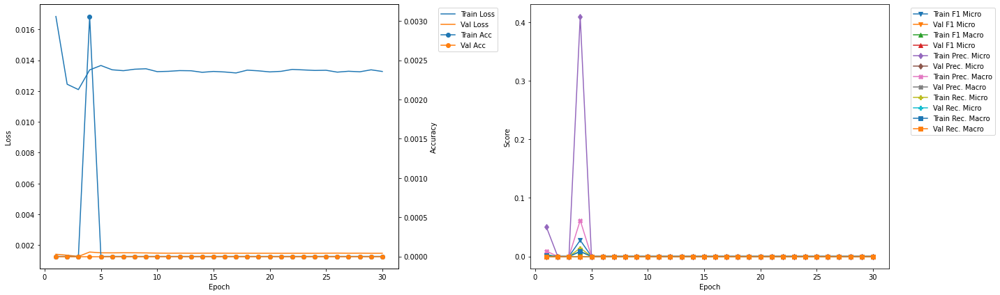

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.82
Train Loss: 0.0135 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.0
Train Loss: 0.0133 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Ma

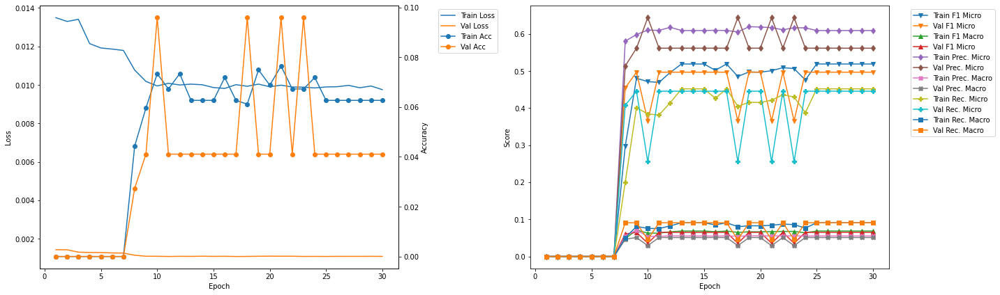

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.496970 --> 0.523529).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 11.47
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4987 	Validation F1 Micro: 0.5235
Train F1 Marco: 0.0701 	Validation F1 Macro: 0.0685
Train Precision Mirco: 0.6021 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0735 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4256 	Validation Recall Micro: 0.4588
Train Recall Marco: 0.086 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.66
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4871 	Validation F1 Micro: 0.5235
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.0685
Train Precision Mirco: 0.6123 	Validation Precision Micro: 0.6096
Train Precision

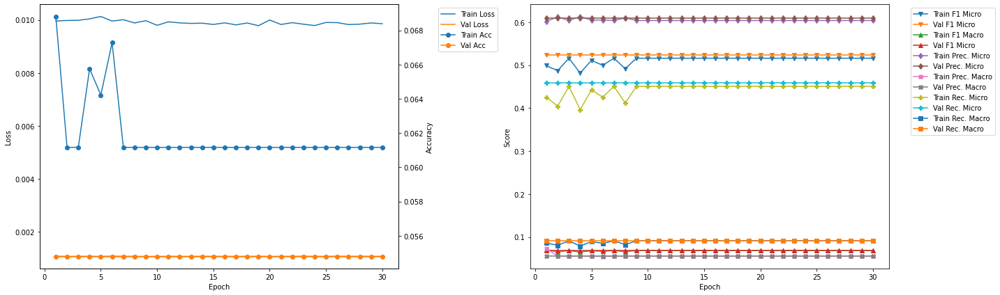

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.523529 --> 0.529915).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 17.11
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5154 	Validation F1 Micro: 0.5299
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.6009 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.4512 	Validation Recall Micro: 0.4537
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.3
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4995 	Validation F1 Micro: 0.5299
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.6026 	Validation Precision Micro: 0.637
Train Precision

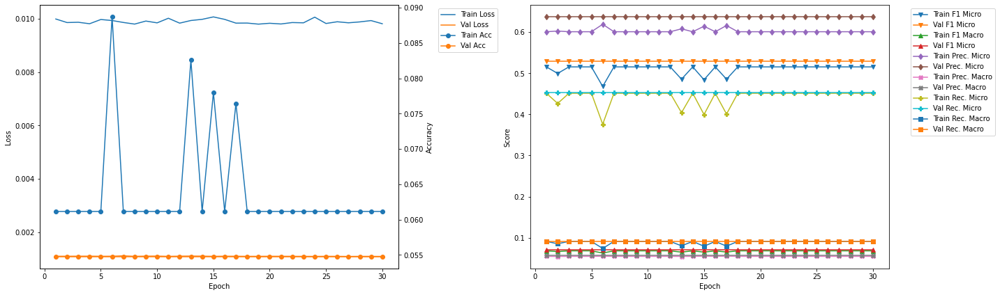

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.72
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4849 	Validation F1 Micro: 0.5194
Train F1 Marco: 0.065 	Validation F1 Macro: 0.0677
Train Precision Mirco: 0.6105 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4022 	Validation Recall Micro: 0.4603
Train Recall Marco: 0.08 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.91
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5166 	Validation F1 Micro: 0.5194
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0677
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4505 	

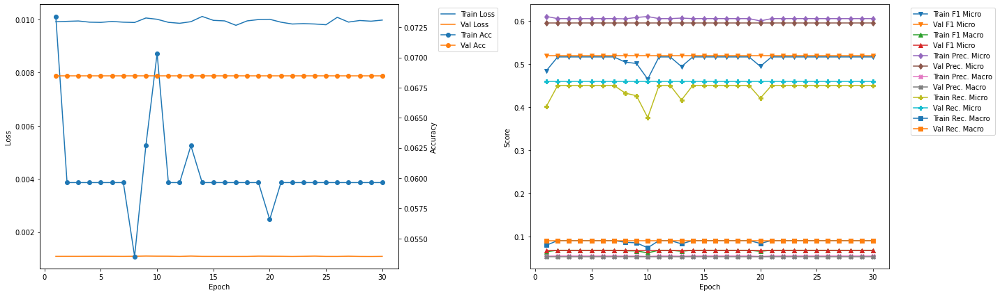

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.34
Train Loss: 0.0097 	Validation Loss: 0.0013
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5232 	Validation F1 Micro: 0.4641
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0662
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4593 	Validation Recall Micro: 0.3889
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.52
Train Loss: 0.0099 	Validation Loss: 0.0013
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5232 	Validation F1 Micro: 0.4641
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0662
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.45

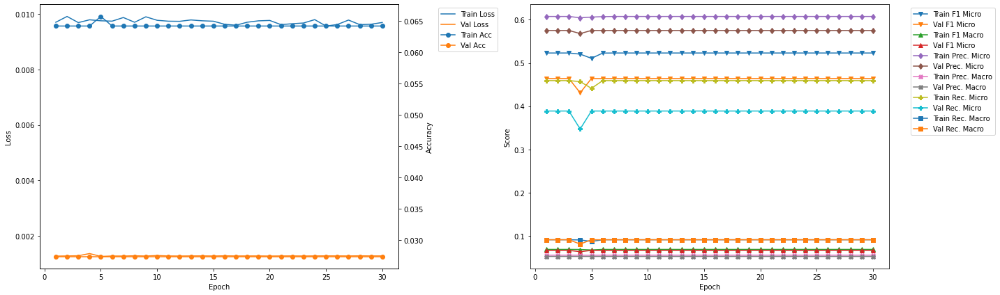

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.95
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5181 	Validation F1 Micro: 0.506
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.607 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4519 	Validation Recall Micro: 0.4474
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.14
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5181 	Validation F1 Micro: 0.506
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.607 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4519 	Vali

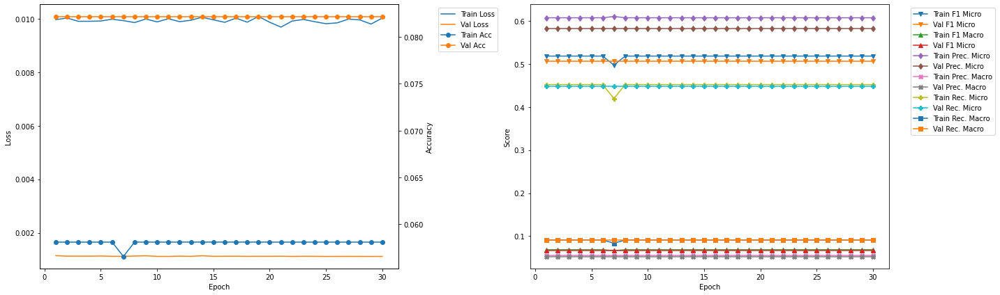

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.56
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5197 	Validation F1 Micro: 0.4909
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6092 	Validation Precision Micro: 0.5625
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4532 	Validation Recall Micro: 0.4355
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.74
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5197 	Validation F1 Micro: 0.4909
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6092 	Validation Precision Micro: 0.5625
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4532

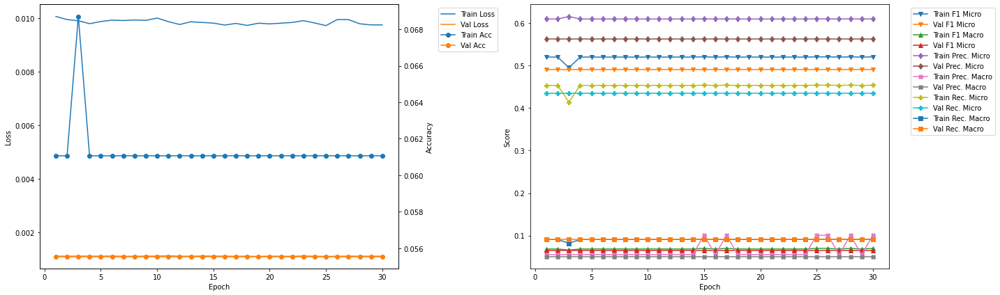

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.16
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.5163 	Validation F1 Micro: 0.5263
Train F1 Marco: 0.0696 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.6026 	Validation Precision Micro: 0.625
Train Precision Marco: 0.1002 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4517 	Validation Recall Micro: 0.4545
Train Recall Marco: 0.0916 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 45.35
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.5163 	Validation F1 Micro: 0.5263
Train F1 Marco: 0.0696 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.6026 	Validation Precision Micro: 0.625
Train Precision Marco: 0.1002 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4517 	

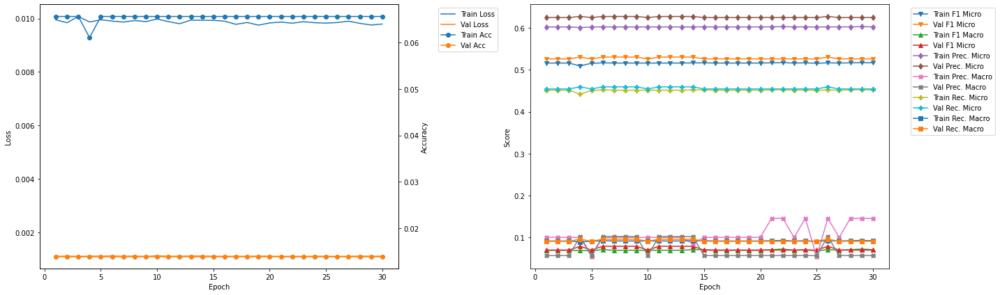

-------------------------------------------
FOLD 10
-------------------------------------------
Validation F1 Micro Score Increased (0.530612 --> 0.569697).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 50.81
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.055 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.5127 	Validation F1 Micro: 0.5697
Train F1 Marco: 0.0718 	Validation F1 Macro: 0.0717
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.6528
Train Precision Marco: 0.1454 	Validation Precision Macro: 0.0593
Train Recall Mirco: 0.4475 	Validation Recall Micro: 0.5054
Train Recall Marco: 0.0929 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 51.0
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.055 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.5112 	Validation F1 Micro: 0.5697
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0717
Train Precision Mirco: 0.5992 	Validation Precision Micro: 0.6528
Train Precision Ma

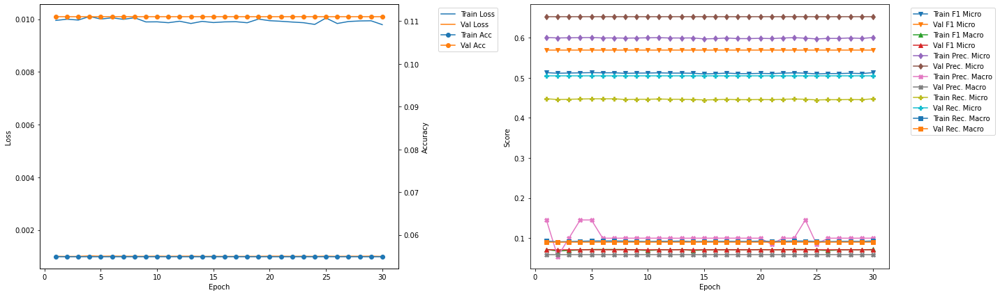

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 1
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.055 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.5127 	Validation F1 Micro: 0.5697
Train F1 Marco: 0.0718 	Validation F1 Macro: 0.0717
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.6528
Train Precision Marco: 0.1454 	Validation Precision Macro: 0.0593
Train Recall Mirco: 0.4475 	Validation Recall Micro: 0.5054
Train Recall Marco: 0.0929 	Validation Recall Macro: 0.0909


In [25]:
vgg11bnLSTM_500_1_50_best = Kfold_train_CNN_RNN(model = vgg11bnLSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg11bnLSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.2
Train Loss: 0.0161 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0044 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0126 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0727 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0162 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0023 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0173 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.4
Train Loss: 0.0126 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

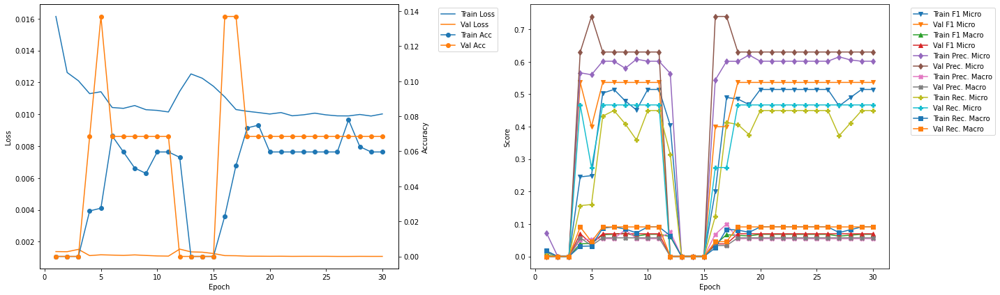

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.25
Train Loss: 0.0109 	Validation Loss: 0.0011
Train Accuracy: 0.0382 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.3843 	Validation F1 Micro: 0.5212
Train F1 Marco: 0.0662 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.5272 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0718 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.3023 	Validation Recall Micro: 0.4674
Train Recall Marco: 0.0648 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.45
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0688 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5002 	Validation F1 Micro: 0.5212
Train F1 Marco: 0.0668 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.608 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4248 	Va

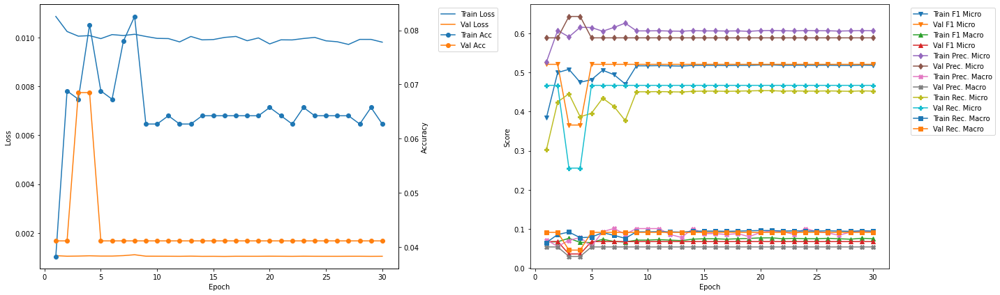

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.27
Train Loss: 0.0103 	Validation Loss: 0.001
Train Accuracy: 0.0703 	Validation Accuracy: 0.137
Train F1 Mirco: 0.4655 	Validation F1 Micro: 0.3843
Train F1 Marco: 0.0666 	Validation F1 Macro: 0.0462
Train Precision Mirco: 0.6051 	Validation Precision Micro: 0.6622
Train Precision Marco: 0.0573 	Validation Precision Macro: 0.0753
Train Recall Mirco: 0.3783 	Validation Recall Micro: 0.2707
Train Recall Marco: 0.0799 	Validation Recall Macro: 0.0511

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.47
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0596 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.47 	Validation F1 Micro: 0.5016
Train F1 Marco: 0.0632 	Validation F1 Macro: 0.0637
Train Precision Mirco: 0.6004 	Validation Precision Micro: 0.5896
Train Precision Marco: 0.0537 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.3862 	Va

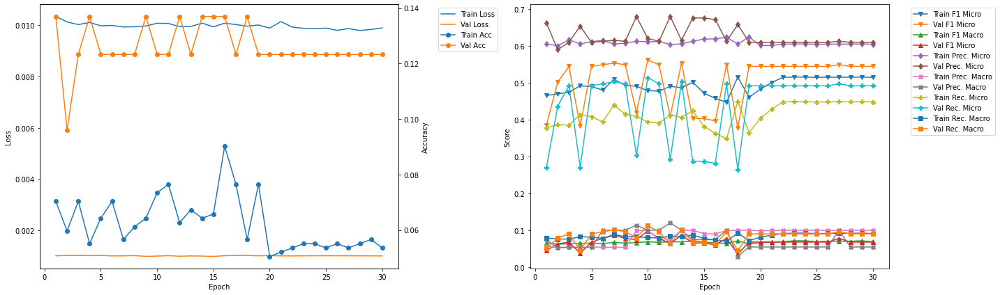

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.38
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4725 	Validation F1 Micro: 0.479
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0642
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.1166 	Validation Precision Macro: 0.0498
Train Recall Mirco: 0.3883 	Validation Recall Micro: 0.4255
Train Recall Marco: 0.0782 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.58
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5215 	Validation F1 Micro: 0.479
Train F1 Marco: 0.0702 	Validation F1 Macro: 0.0642
Train Precision Mirco: 0.6112 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.101 	Validation Precision Macro: 0.0498
Train Recall Mirco: 0.4548 	

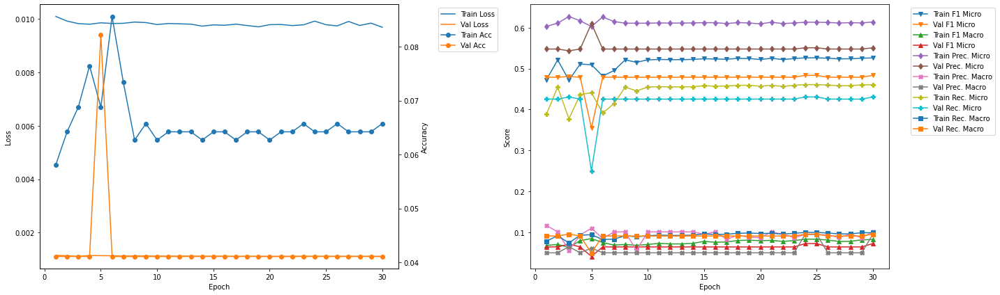

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.4
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0581 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4915 	Validation F1 Micro: 0.3183
Train F1 Marco: 0.0731 	Validation F1 Macro: 0.0351
Train Precision Mirco: 0.597 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0855 	Validation Precision Macro: 0.0286
Train Recall Mirco: 0.4177 	Validation Recall Micro: 0.213
Train Recall Marco: 0.0866 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.6
Train Loss: 0.0104 	Validation Loss: 0.0012
Train Accuracy: 0.0765 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4083 	Validation F1 Micro: 0.5138
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.071
Train Precision Mirco: 0.5845 	Validation Precision Micro: 0.637
Train Precision Marco: 0.1076 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.3137 	Va

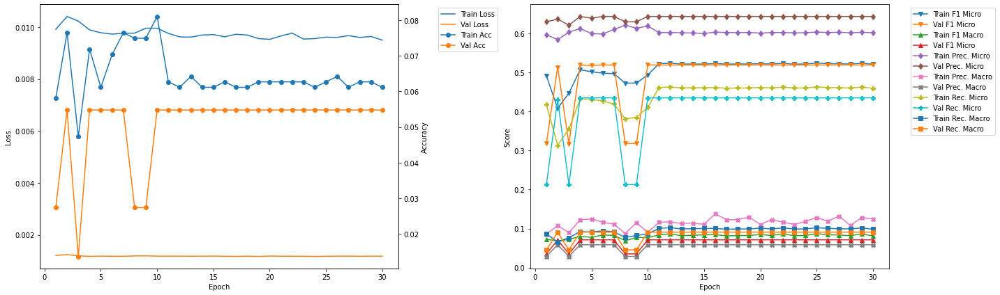

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.43
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0795 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4862 	Validation F1 Micro: 0.365
Train F1 Marco: 0.0834 	Validation F1 Macro: 0.037
Train Precision Mirco: 0.6122 	Validation Precision Micro: 0.6849
Train Precision Marco: 0.1247 	Validation Precision Macro: 0.0311
Train Recall Mirco: 0.4032 	Validation Recall Micro: 0.2488
Train Recall Marco: 0.0892 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.63
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5084 	Validation F1 Micro: 0.5185
Train F1 Marco: 0.0868 	Validation F1 Macro: 0.0851
Train Precision Mirco: 0.6013 	Validation Precision Micro: 0.6067
Train Precision Marco: 0.1518 	Validation Precision Macro: 0.0781
Train Recall Mirco: 0.4404 	

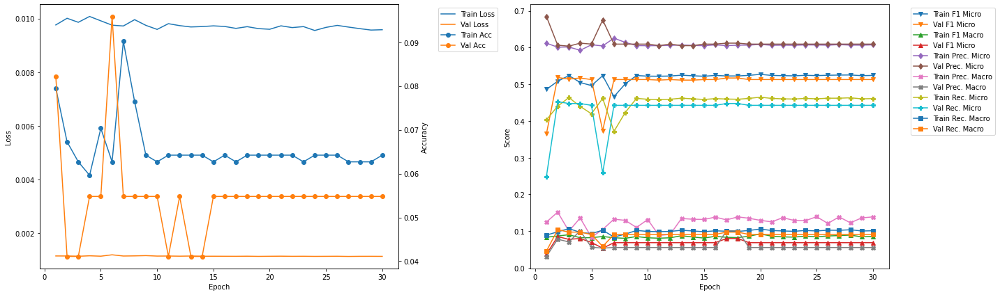

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.45
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.1644
Train F1 Mirco: 0.5201 	Validation F1 Micro: 0.3913
Train F1 Marco: 0.0836 	Validation F1 Macro: 0.0496
Train Precision Mirco: 0.6 	Validation Precision Micro: 0.7297
Train Precision Marco: 0.1066 	Validation Precision Macro: 0.0785
Train Recall Mirco: 0.459 	Validation Recall Micro: 0.2673
Train Recall Marco: 0.1005 	Validation Recall Macro: 0.0519

Epoch 2 	Learning Rate: 0.01 	Time (min): 36.65
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.081 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4548 	Validation F1 Micro: 0.533
Train F1 Marco: 0.0772 	Validation F1 Macro: 0.0813
Train Precision Mirco: 0.6246 	Validation Precision Micro: 0.6327
Train Precision Marco: 0.1252 	Validation Precision Macro: 0.1027
Train Recall Mirco: 0.3576 	Va

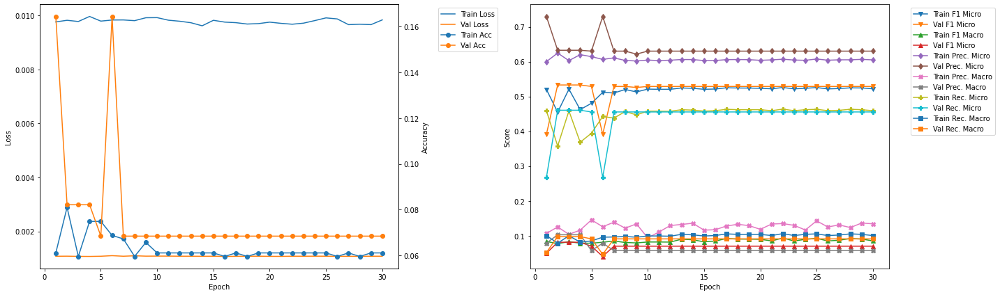

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.48
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0672 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.5129 	Validation F1 Micro: 0.4031
Train F1 Marco: 0.0832 	Validation F1 Macro: 0.0587
Train Precision Mirco: 0.6131 	Validation Precision Micro: 0.6842
Train Precision Marco: 0.1288 	Validation Precision Macro: 0.077
Train Recall Mirco: 0.4408 	Validation Recall Micro: 0.2857
Train Recall Marco: 0.0963 	Validation Recall Macro: 0.0595

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.68
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0748 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4664 	Validation F1 Micro: 0.5382
Train F1 Marco: 0.0742 	Validation F1 Macro: 0.0811
Train Precision Mirco: 0.615 	Validation Precision Micro: 0.6069
Train Precision Marco: 0.1091 	Validation Precision Macro: 0.1004
Train Recall Mirco: 0.3756 	

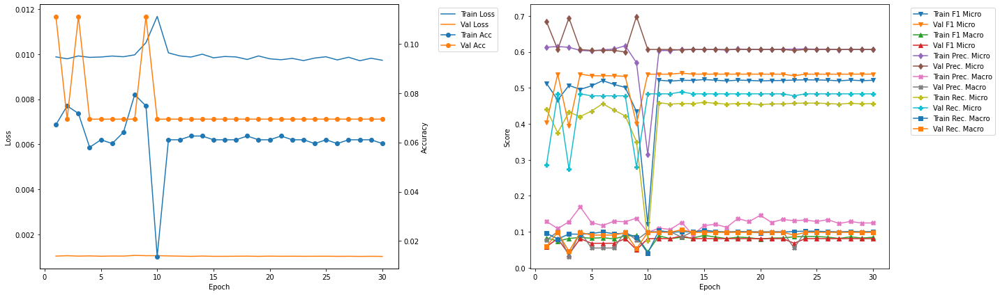

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 48.5
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.058 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4843 	Validation F1 Micro: 0.5086
Train F1 Marco: 0.0734 	Validation F1 Macro: 0.0949
Train Precision Mirco: 0.6114 	Validation Precision Micro: 0.5973
Train Precision Marco: 0.1162 	Validation Precision Macro: 0.1218
Train Recall Mirco: 0.4009 	Validation Recall Micro: 0.4428
Train Recall Marco: 0.083 	Validation Recall Macro: 0.1083

Epoch 2 	Learning Rate: 0.01 	Time (min): 48.7
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4886 	Validation F1 Micro: 0.517
Train F1 Marco: 0.0787 	Validation F1 Macro: 0.1099
Train Precision Mirco: 0.6159 	Validation Precision Micro: 0.6026
Train Precision Marco: 0.1406 	Validation Precision Macro: 0.1329
Train Recall Mirco: 0.4049 	V

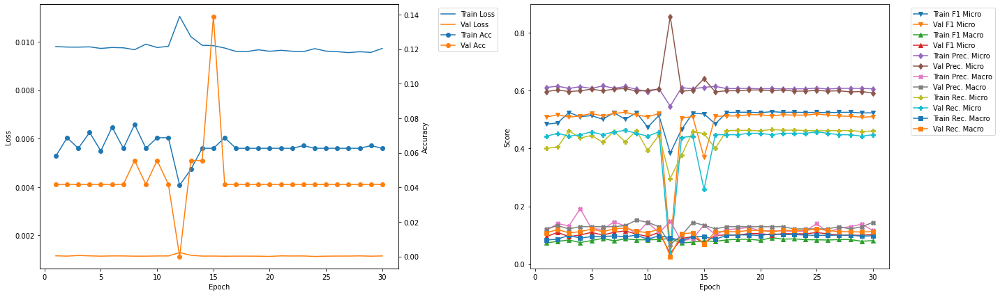

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 54.53
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4883 	Validation F1 Micro: 0.5245
Train F1 Marco: 0.086 	Validation F1 Macro: 0.113
Train Precision Mirco: 0.6051 	Validation Precision Micro: 0.5987
Train Precision Marco: 0.1255 	Validation Precision Macro: 0.1218
Train Recall Mirco: 0.4092 	Validation Recall Micro: 0.4667
Train Recall Marco: 0.091 	Validation Recall Macro: 0.1255

Epoch 2 	Learning Rate: 0.01 	Time (min): 54.73
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4982 	Validation F1 Micro: 0.5202
Train F1 Marco: 0.088 	Validation F1 Macro: 0.1072
Train Precision Mirco: 0.6036 	Validation Precision Micro: 0.596
Train Precision Marco: 0.1096 	Validation Precision Macro: 0.1181
Train Recall Mirco: 0.4241 	

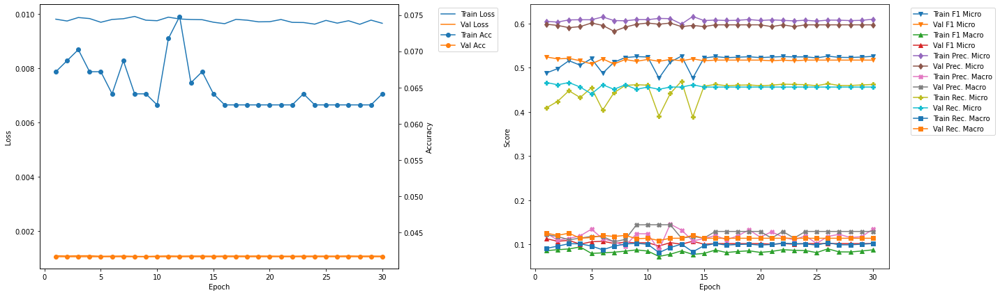

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 3 	Epoch: 10
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0734 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4787 	Validation F1 Micro: 0.5619
Train F1 Marco: 0.0695 	Validation F1 Macro: 0.0991
Train Precision Mirco: 0.6107 	Validation Precision Micro: 0.62
Train Precision Marco: 0.0999 	Validation Precision Macro: 0.1009
Train Recall Mirco: 0.3935 	Validation Recall Micro: 0.5138
Train Recall Marco: 0.081 	Validation Recall Macro: 0.1136


In [26]:
vgg16bnLSTM_500_1_50_best = Kfold_train_CNN_RNN(model = vgg16bnLSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg16bnLSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.21
Train Loss: 0.0201 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0528 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0424 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1286 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1381 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0332 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0363 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.42
Train Loss: 0.0135 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

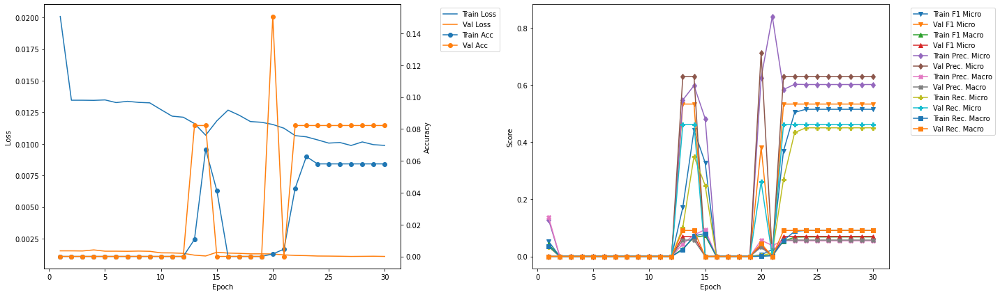

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.49
Train Loss: 0.0123 	Validation Loss: 0.0012
Train Accuracy: 0.0031 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.0724 	Validation F1 Micro: 0.2769
Train F1 Marco: 0.0155 	Validation F1 Macro: 0.03
Train Precision Mirco: 0.355 	Validation Precision Micro: 0.4932
Train Precision Marco: 0.0727 	Validation Precision Macro: 0.0224
Train Recall Mirco: 0.0403 	Validation Recall Micro: 0.1925
Train Recall Marco: 0.0087 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.7
Train Loss: 0.0105 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5023 	Validation F1 Micro: 0.5105
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0665
Train Precision Mirco: 0.6025 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4307 	Val

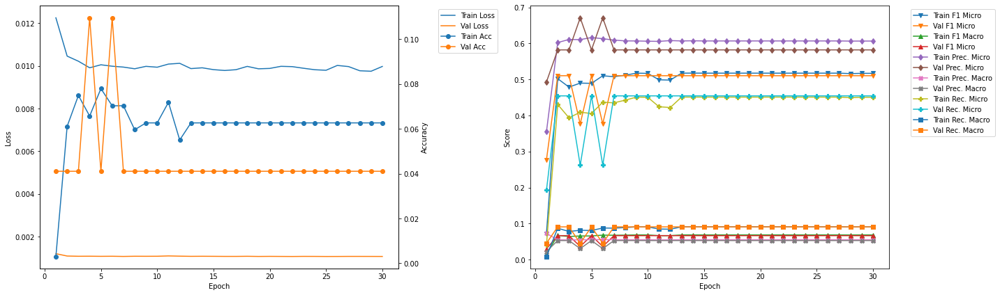

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.73
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.081 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.487 	Validation F1 Micro: 0.451
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0616
Train Precision Mirco: 0.6216 	Validation Precision Micro: 0.5205
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0473
Train Recall Mirco: 0.4003 	Validation Recall Micro: 0.3979
Train Recall Marco: 0.0784 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.94
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5242 	Validation F1 Micro: 0.451
Train F1 Marco: 0.069 	Validation F1 Macro: 0.0616
Train Precision Mirco: 0.6139 	Validation Precision Micro: 0.5205
Train Precision Marco: 0.0558 	Validation Precision Macro: 0.0473
Train Recall Mirco: 0.4573 	V

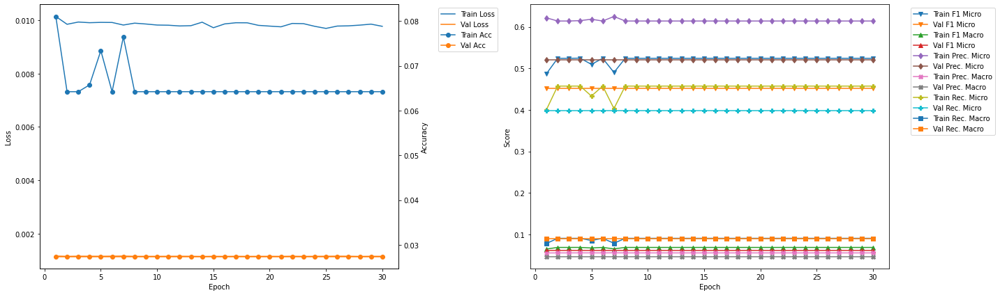

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.98
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5112 	Validation F1 Micro: 0.4894
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0641
Train Precision Mirco: 0.6069 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.4415 	Validation Recall Micro: 0.4378
Train Recall Marco: 0.0884 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.19
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.487 	Validation F1 Micro: 0.4894
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.0641
Train Precision Mirco: 0.614 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.4035 	

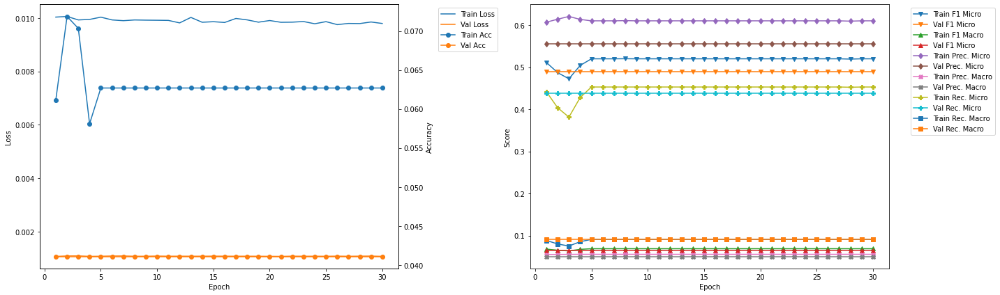

-------------------------------------------
FOLD 5
-------------------------------------------
Validation F1 Micro Score Increased (0.533333 --> 0.537313).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 25.25
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0734 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4883 	Validation F1 Micro: 0.5373
Train F1 Marco: 0.0654 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6069 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4084 	Validation Recall Micro: 0.4762
Train Recall Marco: 0.0817 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.46
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4856 	Validation F1 Micro: 0.3588
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.6114 	Validation Precision Micro: 0.6438
Train Precisio

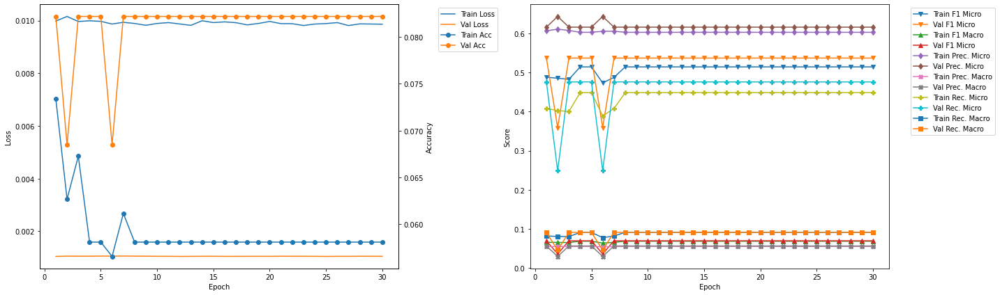

-------------------------------------------
FOLD 6
-------------------------------------------
Validation F1 Micro Score Increased (0.537313 --> 0.558659).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 31.53
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4606 	Validation F1 Micro: 0.5587
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.0739
Train Precision Mirco: 0.5993 	Validation Precision Micro: 0.6849
Train Precision Marco: 0.0701 	Validation Precision Macro: 0.0623
Train Recall Mirco: 0.3741 	Validation Recall Micro: 0.4717
Train Recall Marco: 0.0746 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.74
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4642 	Validation F1 Micro: 0.5587
Train F1 Marco: 0.0621 	Validation F1 Macro: 0.0739
Train Precision Mirco: 0.6039 	Validation Precision Micro: 0.6849
Train Prec

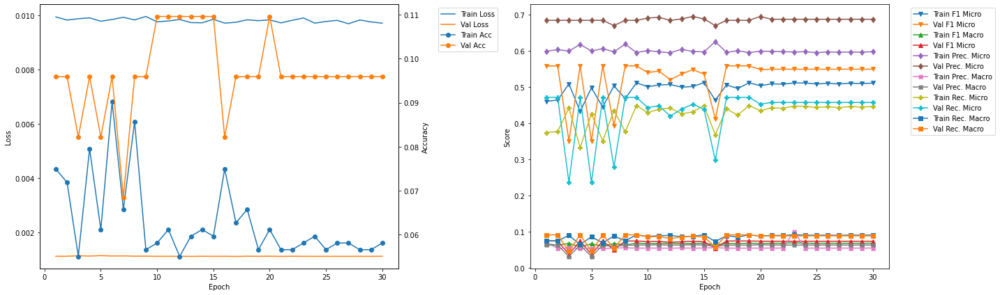

-------------------------------------------
FOLD 7
-------------------------------------------
Validation F1 Micro Score Increased (0.558659 --> 0.567164).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 37.79
Train Loss: 0.0103 	Validation Loss: 0.001
Train Accuracy: 0.0719 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4645 	Validation F1 Micro: 0.5672
Train F1 Marco: 0.0644 	Validation F1 Macro: 0.0715
Train Precision Mirco: 0.6115 	Validation Precision Micro: 0.6552
Train Precision Marco: 0.0701 	Validation Precision Macro: 0.0595
Train Recall Mirco: 0.3745 	Validation Recall Micro: 0.5
Train Recall Marco: 0.0753 	Validation Recall Macro: 0.0899

Validation F1 Micro Score Increased (0.567164 --> 0.571429).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.03
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4824 	Validation F1 Micro: 0.5714
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.072
Tr

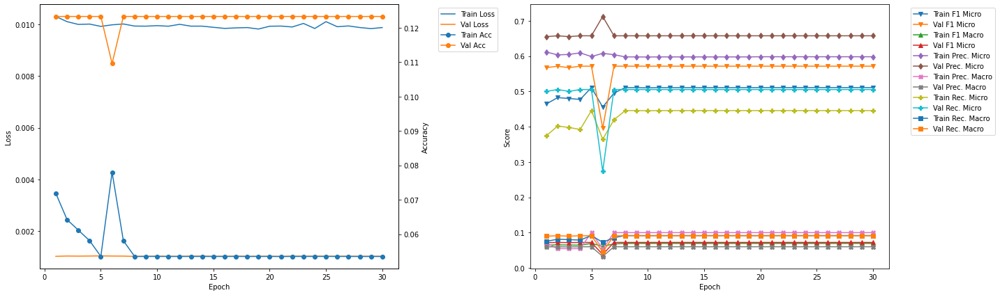

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.09
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5185 	Validation F1 Micro: 0.4911
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0738
Train Precision Mirco: 0.6081 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.098
Train Recall Mirco: 0.4519 	Validation Recall Micro: 0.4323
Train Recall Marco: 0.0905 	Validation Recall Macro: 0.094

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.29
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5188 	Validation F1 Micro: 0.494
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0738
Train Precision Mirco: 0.6069 	Validation Precision Micro: 0.5764
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.098
Train Recall Mirco: 0.453 	Val

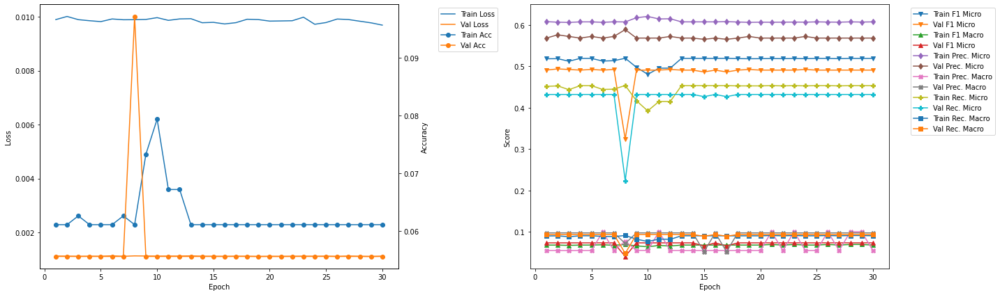

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 50.33
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0779 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4965 	Validation F1 Micro: 0.5225
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.6086 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.1004 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4192 	Validation Recall Micro: 0.4603
Train Recall Marco: 0.0845 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 50.54
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0
Train F1 Mirco: 0.5161 	Validation F1 Micro: 0.5225
Train F1 Marco: 0.0711 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.6041 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.1004 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4505 	Vali

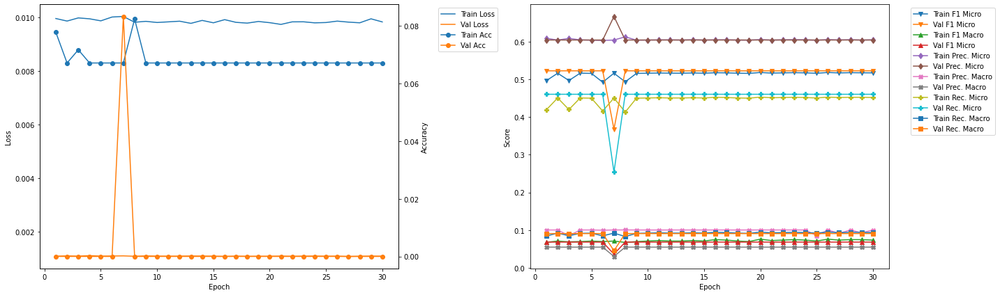

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 56.58
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0763 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4835 	Validation F1 Micro: 0.5028
Train F1 Marco: 0.0696 	Validation F1 Macro: 0.0807
Train Precision Mirco: 0.6187 	Validation Precision Micro: 0.6207
Train Precision Marco: 0.1007 	Validation Precision Macro: 0.1016
Train Recall Mirco: 0.3968 	Validation Recall Micro: 0.4225
Train Recall Marco: 0.0801 	Validation Recall Macro: 0.0974

Epoch 2 	Learning Rate: 0.01 	Time (min): 56.78
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5197 	Validation F1 Micro: 0.4986
Train F1 Marco: 0.0722 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6038 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.1003 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.4

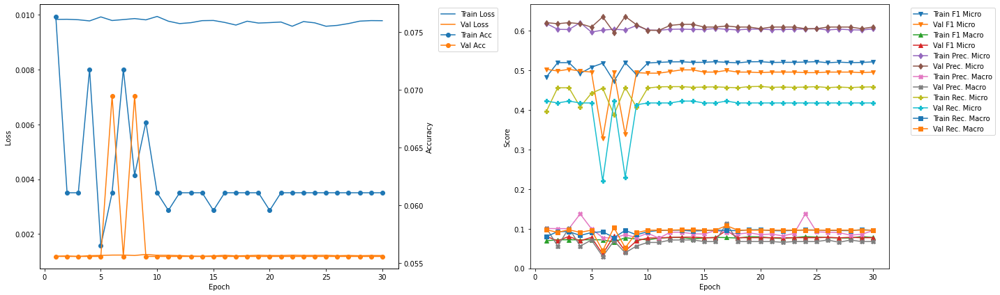

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 7 	Epoch: 2
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4824 	Validation F1 Micro: 0.5714
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.072
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.4018 	Validation Recall Micro: 0.5053
Train Recall Marco: 0.0811 	Validation Recall Macro: 0.0909


In [27]:
vgg19bnLSTM_500_1_50_best = Kfold_train_CNN_RNN(model = vgg19bnLSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg19bnLSTM_500_1_50')

In [28]:
print('Total Training Time (HR:M:S): ' + str(datetime.timedelta(hours = ((time.time() - START) / 60 / 60))).rsplit('.', 1)[0])

Total Training Time (HR:M:S): 7:32:45


## Training Summary

### Summary Table

In [29]:
summaryDF = pd.DataFrame({
    'ResNet18' : resnet18LSTM_500_1_50_best,
    'ResNet50' : resnet50LSTM_500_1_50_best,
    'ResNet101' : resnet101LSTM_500_1_50_best,
    'DenseNet121' : densenet121LSTM_500_1_50_best,
    'DenseNet169' : densenet169LSTM_500_1_50_best,
    'DenseNet201' : densenet201LSTM_500_1_50_best,
    'VGG11_BN' : vgg11bnLSTM_500_1_50_best,
    'VGG16_BN' : vgg16bnLSTM_500_1_50_best,
    'VGG19_BN' : vgg19bnLSTM_500_1_50_best
})
summaryDF.index = ['Fold', 'Epoch', 'Train Loss', 'Train Accuracy', 'Train F1 Micro', 'Train F1 Macro', 'Train Precision Micro', 'Train Precision Macro', 'Train Recall Micro', 'Train Recall Macro',
                   'Val Loss', 'Val Accuracy', 'Val F1 Micro', 'Val F1 Macro', 'Val Precision Micro', 'Val Precision Macro', 'Val Recall Micro', 'Val Recall Macro']

summaryDF

,ResNet18,ResNet50,ResNet101,DenseNet121,DenseNet169,DenseNet201,VGG11_BN,VGG16_BN,VGG19_BN
Fold,1.000000,4.000000,2.000000,1.000000,6.000000,6.000000,10.000000,3.000000,7.000000
Epoch,6.000000,1.000000,13.000000,4.000000,4.000000,1.000000,1.000000,10.000000,2.000000
Train Loss,0.011429,0.010174,0.010019,0.010817,0.009798,0.009880,0.009953,0.010083,0.010106
Train Accuracy,0.000000,0.087156,0.091743,0.045872,0.071865,0.064220,0.054962,0.073394,0.064220
Train F1 Micro,0.000000,0.475725,0.473389,0.416573,0.498636,0.465937,0.512687,0.478650,0.482405
Train F1 Macro,0.000000,0.067295,0.063919,0.058914,0.120564,0.085412,0.071842,0.069515,0.065237
Train Precision Micro,0.000000,0.614621,0.607914,0.599356,0.624253,0.608856,0.600152,0.610721,0.603419
Train Precision Macro,0.000000,0.073639,0.065748,0.054309,0.415470,0.212544,0.145385,0.099930,0.054560
Train Recall Micro,0.000000,0.388034,0.387615,0.319222,0.415105,0.377358,0.447473,0.393545,0.401821
Train Recall Macro,0.000000,0.078078,0.076964,0.064402,0.111890,0.086822,0.092909,0.081002,0.081108


In [30]:
summaryDF.to_csv('BestCnnRnnModels/BestModels_500_1_50.csv')

### Training Summary Graph

In [31]:
import plotly
import plotly.graph_objects as go

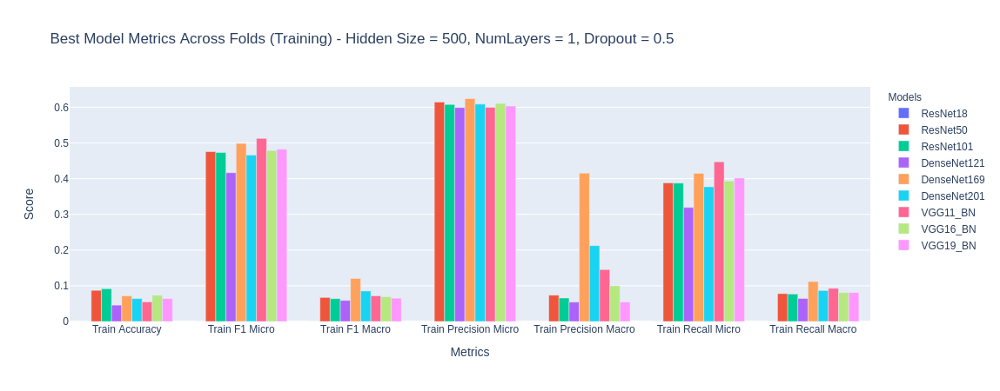

In [32]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[3:10], y = summaryDF['ResNet18'][3:10]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[3:10], y = summaryDF['ResNet50'][3:10]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[3:10], y = summaryDF['ResNet101'][3:10]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[3:10], y = summaryDF['DenseNet121'][3:10]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[3:10], y = summaryDF['DenseNet169'][3:10]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[3:10], y = summaryDF['DenseNet201'][3:10]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[3:10], y = summaryDF['VGG11_BN'][3:10]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[3:10], y = summaryDF['VGG16_BN'][3:10]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[3:10], y = summaryDF['VGG19_BN'][3:10]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Training) - Hidden Size = 500, NumLayers = 1, Dropout = 0.5',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

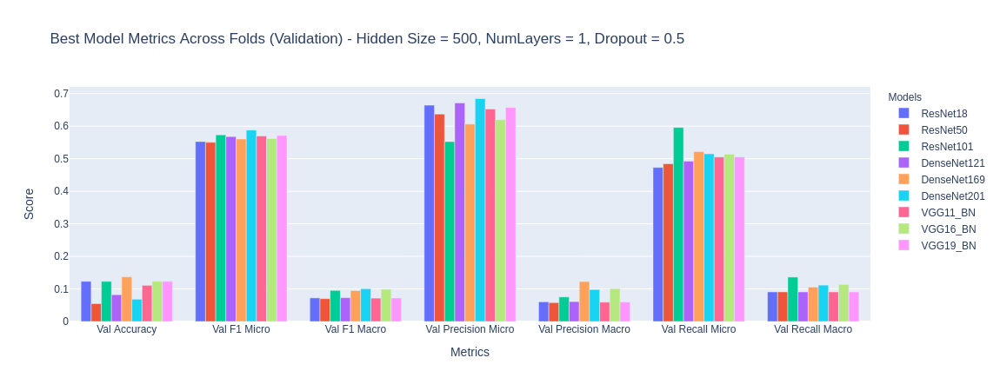

In [33]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[11:], y = summaryDF['ResNet18'][11:]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[11:], y = summaryDF['ResNet50'][11:]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[11:], y = summaryDF['ResNet101'][11:]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[11:], y = summaryDF['DenseNet121'][11:]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[11:], y = summaryDF['DenseNet169'][11:]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[11:], y = summaryDF['DenseNet201'][11:]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[11:], y = summaryDF['VGG11_BN'][11:]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[11:], y = summaryDF['VGG16_BN'][11:]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[11:], y = summaryDF['VGG19_BN'][11:]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Validation) - Hidden Size = 500, NumLayers = 1, Dropout = 0.5',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()